# Предобработка данных

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
!wget http://shannon.cs.illinois.edu/DenotationGraph/data/flickr30k-images.tar

--2020-02-22 22:28:38--  http://shannon.cs.illinois.edu/DenotationGraph/data/flickr30k-images.tar
Resolving shannon.cs.illinois.edu (shannon.cs.illinois.edu)... 18.220.149.166
Connecting to shannon.cs.illinois.edu (shannon.cs.illinois.edu)|18.220.149.166|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4440780800 (4.1G) [application/x-tar]
Saving to: ‘flickr30k-images.tar’

flickr30k-images.ta 100%[===================>]   4.14G  42.0MB/s    in 1m 40s  

2020-02-22 22:30:18 (42.3 MB/s) - ‘flickr30k-images.tar’ saved [4440780800/4440780800]



In [3]:
%%time
!tar -xf '/content/flickr30k-images.tar'

CPU times: user 318 ms, sys: 33.9 ms, total: 352 ms
Wall time: 1min 29s


In [0]:
from torchvision import transforms, datasets
import os
import torch, torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from torch.utils.data import Dataset, DataLoader
import random

In [0]:
image_dir = '/content/flickr30k-images' 

# Перед подачей в энкодер надо будет нормализовать вход
image_transform = transforms.Compose([
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])

## Подготовка captions

В results_new.csv (файл лежит в папке с ноутбуками) есть список имен файлов картинок и соответствующие им заголовки. Одной картинке соответствует 5 строк из файла. 

In [0]:
results = pd.read_csv("/content/drive/My Drive/Image Captioning/Flickr30/results_new.csv", sep='|', index_col=None)

In [7]:
results.head(15)

,image_name,comment_number,comment
0,1000092795.jpg,0,Two young guys with shaggy hair look at their...
1,1000092795.jpg,1,"Two young , White males are outside near many..."
2,1000092795.jpg,2,Two men in green shirts are standing in a yard .
3,1000092795.jpg,3,A man in a blue shirt standing in a garden .
4,1000092795.jpg,4,Two friends enjoy time spent together .
5,10002456.jpg,0,Several men in hard hats are operating a gian...
6,10002456.jpg,1,Workers look down from up above on a piece of...
7,10002456.jpg,2,Two men working on a machine wearing hard hats .
8,10002456.jpg,3,Four men on top of a tall structure .
9,10002456.jpg,4,Three men on a large rig .


In [0]:
# Переименуем колонки, чтобы убрать пробелы в начале имени
results.columns = ['image_name', 'comment_number', 'comment']

In [0]:
# Приведем строки к нижнему регистру
results.comment = results.comment.str.lower()

In [0]:
# Сгруппируем все заголовки для одной картинки в массив
results = results.groupby('image_name')['comment'].apply(list).reset_index(name='captions')

In [11]:
results

,image_name,captions
0,1000092795.jpg,[ two young guys with shaggy hair look at thei...
1,10002456.jpg,[ several men in hard hats are operating a gia...
2,1000268201.jpg,[ a child in a pink dress is climbing up a set...
3,1000344755.jpg,[ someone in a blue shirt and hat is standing ...
4,1000366164.jpg,"[ two men , one in a gray shirt , one in a bla..."
...,...,...
31778,997338199.jpg,"[ woman writing on a pad in room with gold , d..."
31779,997722733.jpg,[ a person in a red shirt climbing up a rock f...
31780,997876722.jpg,[ two male construction workers are working on...
31781,99804383.jpg,[ an older busker in glasses plays an eastern ...


In [12]:
results.image_name[0]

'1000092795.jpg'

In [13]:
results.captions[0]

[' two young guys with shaggy hair look at their hands while hanging out in the yard .',
 ' two young , white males are outside near many bushes .',
 ' two men in green shirts are standing in a yard .',
 ' a man in a blue shirt standing in a garden .',
 ' two friends enjoy time spent together .']

In [14]:
len(results)

31783

Разделим датафрейм на tran и val:

In [0]:
seed = 42

random.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)
torch.backends.cudnn.deterministic = True

In [0]:
from sklearn.model_selection import train_test_split

train_set, val_set = train_test_split(results, test_size=1024)

In [0]:
val_set.index = range(len(val_set))

In [18]:
val_set

,image_name,captions
0,3655176735.jpg,[ an older woman appears to read from a childr...
1,7669392800.jpg,[ numerous bicyclists wearing bicyclist appare...
2,4546029322.jpg,[ in this picture we see multiple people cross...
3,120764850.jpg,[ a baby on the floor laughing at an older ano...
4,2912210904.jpg,[ a man loads trees onto a cart on the side of...
...,...,...
1019,6813684611.jpg,[ three people are playing music ; two with vi...
1020,3288203502.jpg,[ redheaded woman holding clear plastic over p...
1021,6221289833.jpg,[ a boy wearing a white and green athletic uni...
1022,241345323.jpg,[ sooners football player number 50 plays in a...


In [0]:
train_set.index = range(len(train_set))

In [20]:
train_set

,image_name,captions
0,2251277216.jpg,[ various people are walking along a path towa...
1,263216826.jpg,[ a man and a woman in an orange shirt are sit...
2,3627929314.jpg,[ a little boy sitting on the ground looking u...
3,3019986034.jpg,[ a woman in a plaid skirt is playing a violin...
4,4508999124.jpg,[ a small boy with a blue and yellow backpack ...
...,...,...
30754,7108301125.jpg,[ several women are playing some sort of sport...
30755,2380519648.jpg,[ a man with a cap and not wearing shirt is la...
30756,128396207.jpg,"[ a bike rider with khaki green shorts , a blu..."
30757,361831875.jpg,[ a person in a green coat looks upwards while...


Посчитаем число вхождений каждого слова:

In [0]:
from collections import Counter
token_counts = Counter()

for cap in train_set.captions:
    for line in cap:
        token_counts.update(line.split())

In [22]:
token_counts.most_common(10)

[('a', 263031),
 ('.', 146139),
 ('in', 80901),
 ('the', 61002),
 ('on', 44158),
 ('and', 42866),
 ('man', 41190),
 ('is', 39806),
 ('of', 37532),
 ('with', 35041)]

Загрузим предобученные эмбеддинги:

In [23]:
!wget https://dl.fbaipublicfiles.com/fasttext/vectors-english/crawl-300d-2M.vec.zip #https://dl.fbaipublicfiles.com/fasttext/vectors-english/wiki-news-300d-1M-subword.vec.zip #https://dl.fbaipublicfiles.com/fasttext/vectors-english/wiki-news-300d-1M.vec.zip

--2020-02-22 22:32:12--  https://dl.fbaipublicfiles.com/fasttext/vectors-english/crawl-300d-2M.vec.zip
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 104.20.22.166, 104.20.6.166, 2606:4700:10::6814:6a6, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|104.20.22.166|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1523785255 (1.4G) [application/zip]
Saving to: ‘crawl-300d-2M.vec.zip’

crawl-300d-2M.vec.z 100%[===================>]   1.42G  47.7MB/s    in 37s     

2020-02-22 22:32:50 (39.1 MB/s) - ‘crawl-300d-2M.vec.zip’ saved [1523785255/1523785255]



In [24]:
!unzip '/content/crawl-300d-2M.vec.zip' 

Archive:  /content/crawl-300d-2M.vec.zip
  inflating: crawl-300d-2M.vec       


In [0]:
import gensim

In [26]:
%%time
w2v_model = gensim.models.KeyedVectors.load_word2vec_format(fname='/content/crawl-300d-2M.vec', binary=False)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


CPU times: user 9min 14s, sys: 7.53 s, total: 9min 21s
Wall time: 9min 19s


Построим словарь токенов:

In [0]:
min_count = 5
tokens = [token for token, num in token_counts.items() if (token in w2v_model and num>=min_count)]

Добавим в словарь специальные символы:

In [0]:
UNK, PAD, BOS, EOS = "UNK", "PAD", "<bos>", "<eos>"
tokens = [PAD, BOS, EOS, UNK] + tokens

In [29]:
len(tokens)

7628

In [0]:
n_tokens = len(tokens)

In [0]:
token_to_id = {t:i for i, t in enumerate(tokens)}

In [0]:
UNK_IDX, PAD_IDX = token_to_id["UNK"], token_to_id["PAD"]
BOS_IDX, EOS_IDX = token_to_id["<bos>"], token_to_id["<eos>"]

In [33]:
numpy_embeddings = np.zeros(shape=[len(tokens), 300],dtype=np.float32)

for word in tokens:
    if word in w2v_model:
        vector = w2v_model.get_vector(word)
        index  = token_to_id[word]
        numpy_embeddings[index] = vector
        
pretrained_embeddings = torch.FloatTensor(numpy_embeddings)
pretrained_embeddings.shape

torch.Size([7628, 300])

## Формирование датасетов для обучения и валидации

In [0]:
def as_matrix(sequences, max_len=None):
    """ 
    Convert a list of tokens into a matrix with padding 
    params:
        sequences: list of sentences. Each sentence is a tokenized string or list of tokens
        max_len: if specified, 
    """
    if isinstance(sequences[0], str):
        sequences = list(map(str.split, sequences))
    
    max_len = min(max(map(len, sequences)), max_len or float('inf'))
    
    matrix = np.full((len(sequences), max_len+2), np.int32(PAD_IDX))
    for i,seq in enumerate(sequences):
        row_ix = [BOS_IDX] + [token_to_id.get(word, UNK_IDX) for word in seq[:max_len]] + [EOS_IDX]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [0]:
# batch generator. Можно заменить на свой/переделать этот
from random import choice

def generate_batch(dataset, batch_size, max_caption_len=None):
    
    #sample random numbers for image/caption indicies
    random_index = np.random.randint(0, len(dataset), size=batch_size)
    
    batch_images, batch_captions = None, []

    for ind in random_index:

        image, captions = dataset[ind]

        if batch_images is None:
            batch_images = image.unsqueeze(0)
        else:
            batch_images = torch.cat((batch_images, image.unsqueeze(0)), 0)

        caption = choice(captions)

        batch_captions.append(caption)

    batch_captions = as_matrix(batch_captions, max_caption_len)
    
    return batch_images, torch.tensor(batch_captions, dtype=torch.int64) 

In [0]:
class FlickrDataset(Dataset):
    """Flickr30 dataset."""

    def __init__(self, data_frame, root_dir, image_transform):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.data_frame = data_frame 
        self.root_dir = root_dir
        self.image_transform = image_transform

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        
        image_name = os.path.join(self.root_dir,
                                self.data_frame.image_name[idx])
        image = plt.imread(image_name)
        # Картинки будем приводить к размеру (256, 256), чтобы тензор для внимания получился (8, 8)
        image = np.array(Image.fromarray(image).resize((256, 256))).astype('float32') / 255.
        image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
        if self.image_transform is not None:
            image = self.image_transform(image)

        captions = self.data_frame.captions[idx]

        return image, captions

    def show_sample(self, idx):

        image_name = os.path.join(self.root_dir,
                                self.data_frame.image_name[idx])
        image = plt.imread(image_name)
        image = np.array(Image.fromarray(image).resize((299, 299))).astype('float32') / 255.

        captions = self.data_frame.captions[idx]
        captions = np.array(captions)

        plt.imshow(image)
        print(captions)

### Train dataset

In [0]:
train_dataset = FlickrDataset(train_set, image_dir, image_transform)

In [38]:
len(train_dataset)

30759

Посмотрим на примеры из датасета для обучения:

[' various people are walking along a path towards a fenced-in area that is surrounded by small buildings .'
 ' people running on a sidewalk in the middle of a grassy area .'
 ' people running and walking in and out of a small farm town .'
 ' several couples running down the road to a farm house .'
 ' a woman runs along the sidewalk .']


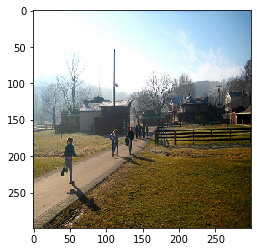

In [0]:
train_dataset.show_sample(0)

[' crowded street with a man holding a subway sign pointing customers to a subway sandwich shop .'
 ' a man dressed in blue , holding a subway sandwich sign on the sidewalk .'
 ' a man in a blue shirt and blue jeans standing behind a subway sign .'
 ' a man in all bright blue against a subway sign in new york city .'
 ' man holding a sign promoting subway restaurant .']


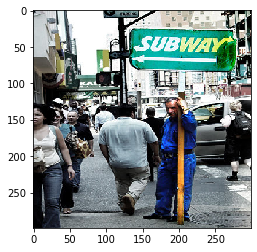

In [0]:
train_dataset.show_sample(12345)

Протестируем генерацию батча:

In [0]:
# max_caption_len без учета спец символов для начала и конца предложения
batch = generate_batch(train_dataset, 3, max_caption_len=10)

In [0]:
batch[1]

tensor([[   1,    9,  412,    5,   45,   35,   29, 1611,   22,    9,  409,    2],
        [   1,  180,   15,   42,  515,  421,   56,  422,   27, 1201,  208,    2],
        [   1,   25,  249,   15,   87, 2255, 2857,   56,  619,  106,   24,    2]])

In [0]:
batch[0].shape, batch[1].shape

(torch.Size([3, 3, 256, 256]), torch.Size([3, 12]))

А теперь без ограничения длины:

In [0]:
batch = generate_batch(train_dataset, 3)

In [0]:
batch[1]

tensor([[   1,    9,   63,  122,   98,    9, 4665,  137,  251,   30,  208,   25,
           91,   63,  122,   37,  807,   20,    2,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
        [   1,    9,   41,   24,    9,  139,  110,   48, 4945,   76,   48,   25,
          303,  203,    9,  155,   27,  133, 1525,   20,    2,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
        [   1,   61,  108,   68,   87,  100,  170,   56,    9,   94,  111,   29,
           94,   29,  520,  116,   87,    9, 3843,  112,   25,   91,   74,    9,
         2489,   29,    9, 7556, 1645,   44,   87,    9, 2447,   20,    2]])

In [0]:
batch[0].shape, batch[1].shape

(torch.Size([3, 3, 256, 256]), torch.Size([3, 35]))

### Validation dataset

In [0]:
# Переводит массив индексов в строку/массив с токенами (до первого символа конца строки)
def translate(list_ind, to_str=True):
  
  if EOS_IDX in list_ind:
    max_ind = list_ind.index(EOS_IDX)
  else:
    max_ind = len(list_ind)

  if to_str:
    return (' ').join([tokens[ind] for ind in list_ind[:max_ind]])
  else:
    return [tokens[ind] for ind in list_ind[:max_ind]]

In [0]:
import nltk
from nltk.translate.bleu_score import corpus_bleu

In [0]:
val_dataset = FlickrDataset(val_set, image_dir, image_transform)

In [42]:
len(val_dataset)

1024

[' swimming instructors teaching young girls how to float in a pool .'
 ' man in black swimsuit plays in pool with three young children .'
 ' two men in wetsuits supervise children as they learn to swim .'
 ' swimming instructors show young girls how to float .'
 ' a group of children learning to swim .']


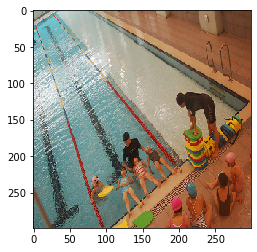

In [0]:
# Fixed example - каждую эпоху для него будем выводить сгенерированный моделью заголовок для сравнения
val_dataset.show_sample(992)

In [0]:
batch_size_val = 32

In [0]:
val_size = len(val_dataset) // batch_size_val * batch_size_val

In [45]:
val_size

1024

In [0]:
# Для расчета bleu
references = []
for cap in val_set.captions[:val_size]:
  new_cap = []
  for str_cap in cap:
    new_cap.append(list(str_cap.split()))
  references.append(new_cap)

In [0]:
references[0]

[['an',
  'older',
  'woman',
  'appears',
  'to',
  'read',
  'from',
  'a',
  'children',
  "'s",
  'book',
  'in',
  'an',
  'indoor',
  'setting',
  ',',
  'while',
  'a',
  'seated',
  'gentleman',
  'in',
  'a',
  'service',
  'uniform',
  'looks',
  'on',
  '.'],
 ['a',
  'woman',
  'with',
  'short',
  'black',
  'hair',
  'and',
  'a',
  'colorful',
  'necklace',
  'reads',
  'a',
  'children',
  "'s",
  'illustration',
  'book',
  '.'],
 ['a',
  'woman',
  'with',
  'a',
  'white',
  'shirt',
  'holding',
  'a',
  'children',
  'book',
  '.'],
 ['a', 'woman', 'reading', 'a', 'children', "'s", 'book', '.'],
 ['a', 'lady', 'reading', 'a', 'story', 'book', '.']]

In [0]:
# batch generator
# Для валидации идем по порядку по всему датасету
def generate_batch_val(dataset, indx, batch_size, max_caption_len=None):
    
    batch_images, batch_captions = None, []

    for ind in range(indx, indx+batch_size):

        image, captions = dataset[ind]

        if batch_images is None:
            batch_images = image.unsqueeze(0)
        else:
            batch_images = torch.cat((batch_images, image.unsqueeze(0)), 0)

        # Здесь берем случайный заголовок, как для train
        # Для COCO я всегда брала первый
        caption = choice(captions)

        batch_captions.append(caption)

    batch_captions = as_matrix(batch_captions, max_caption_len)
    
    return batch_images, torch.tensor(batch_captions, dtype=torch.int64)  

In [0]:
def evaluate(model, criterion, max_len=None, val_size=len(val_dataset), batch_size=batch_size_val):
    
    model.eval()
    
    epoch_loss = 0
    bleu = 0
    hypotheses = []

    # Не учитываем последний неполный батч
    val_size = val_size // batch_size * batch_size

    random_ind = random.randint(0, val_size-1)
    
    with torch.no_grad():
    
        for i in range(0, val_size, batch_size):

            image_vectors, captions_ix = generate_batch_val(val_dataset, i, batch_size) 
            
            image_vectors, captions_ix = image_vectors.to(device), captions_ix.to(device)

            captions_ix_next = captions_ix[:, 1:].contiguous()
        
            outputs, atts = network(image_vectors, captions_ix, teacher_forcing_ratio=0.)

            loss = criterion(outputs.contiguous().view(-1, outputs.shape[-1]), captions_ix_next.view(-1))
            
            epoch_loss += loss.item()

            outputs_max = outputs.argmax(-1)
            for out in outputs_max:
              hypotheses.append(translate(out.tolist(), to_str=False))

            if random_ind in range(i,i+batch_size):
              # Случайный пример для контроля
              print('Random example:')
              print('\tTarget: {}'.format(translate(captions_ix_next[random_ind % batch_size].tolist())))
              print('\tOutput: {}'.format(translate(outputs.argmax(-1)[random_ind % batch_size].tolist())))

    # Фиксированный пример для сравнения между эпохами
    print('Fixed example :')
    print('\tTarget: {}'.format(translate(captions_ix_next[0].tolist())))
    print('\tOutput: {}'.format(translate(outputs.argmax(-1)[0].tolist())))

    bleu = corpus_bleu(references, hypotheses)
        
    return epoch_loss / (val_size // batch_size), bleu*100

# Посторение нейросети

##Encoder

In [0]:
class Encoder(nn.Module):
    """
    Encoder.
    """

    def __init__(self):
        super(Encoder, self).__init__()

        resnet = models.resnet101(pretrained=True) 

        # Удаляем пулинг и последний линейный слой
        # На выходе будем получать тензор (batch_size, 2048, 8, 8)
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)

        # Добавляем свой пулинг для получения вектора (batch_size, 2048)
        self.adaptive_pool = nn.AdaptiveAvgPool2d(1)

        self.fine_tune()

    def forward(self, images):
        """
        Forward propagation.
        :param images: images, a tensor of dimensions (batch_size, 3, image_size, image_size)
        :return: encoded images
        """
        # (batch_size, 2048, 8, 8)
        out = self.resnet(images)
        
        # (batch_size, 2048, 1, 1)
        out_lin = self.adaptive_pool(out)
        
        # (batch_size, 2048)
        out_lin = out_lin.squeeze(2).squeeze(2) 
        return out, out_lin

    def fine_tune(self, fine_tune=False):
        """
        Allow or prevent the computation of gradients for convolutional blocks 2 through 4 of the encoder.
        :param fine_tune: Allow?
        """
        # Веса менять не будем
        for p in self.resnet.parameters():
            p.requires_grad = False

##Decoder + Attention (II)

In [0]:
class Attention(nn.Module):
    def __init__(self, cnn_feature_size, hid_dim): 
        
        super(Attention, self).__init__()

        self.hid_dim = hid_dim
        self.cnn_feature_size = cnn_feature_size

        self.fc_1 = nn.Linear(self.cnn_feature_size, self.hid_dim)
        self.fc_2 = nn.Linear(self.hid_dim, self.hid_dim)
       
    def forward(self, encoder_output, output, seq_len=None):

        # INPUT
        # encoder_output : (batch_size x max_len x hidden_dim) (batch_size x max_len x cnn_feature_size)
        # output : (1 x batch_size x hidden_dim) (batch_size x 1 x hidden_dim)
        #
        # OUTPUT
        # x : (batch_size x max_len)

        # (batch_size x max_len x cnn_feature_size) -> (batch_size x max_len x hidden_dim)
        x = torch.sigmoid(self.fc_1(encoder_output))
        # (batch_size x hidden_dim) -> (batch_size x hidden_dim x 1)
        y = torch.sigmoid(self.fc_2(output)).unsqueeze(2) 

        # Используем матричное умножение вместо линейного слоя
        # (batch_size x max_len)
        att_weight = F.softmax(torch.bmm(x, y).squeeze(2), dim=-1)

        # (batch_size x cnn_feature_size)
        att = (encoder_output * att_weight.unsqueeze(2)).sum(dim=1) 

        return att, att_weight

In [0]:
class Decoder(nn.Module):
    def __init__(self, attention, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_feature_size=2048, num_layers=1):
        super(self.__class__, self).__init__()
        
        self.n_tokens = n_tokens
        self.attention = attention

        self.fc_1 = nn.Linear(lstm_units, cnn_feature_size)

        # create embedding for input words
        self.embed = nn.Embedding.from_pretrained(pretrained_embeddings, freeze=True, padding_idx=PAD_IDX) 
        self.drop = nn.Dropout(0.4) 
            
        # lstm
        self.lstm = nn.LSTMCell(emb_size + cnn_feature_size, lstm_units, bias=True) 

        self.drop_2 = nn.Dropout(0.1)

        # линейный слой для получения логитов
        self.fc_2 = nn.Linear(lstm_units, n_tokens)

        self.init_weights()
        
    def forward(self, captions, encoder_outputs, hidden=None, cell=None, teacher_forcing_ratio=1.):
        """ 
        Apply the network in training mode. 
        :param image_vectors: torch tensor, содержаший выходы inseption. Те, из которых будем генерить текст
                shape: [batch, cnn_feature_size]
        :param captions_ix: 
                таргет описания картинок в виде матрицы
        :returns: логиты для сгенерированного текста описания, shape: [batch, word_i, n_tokens]
        """

        # (batch_size)
        captions = captions 
        
        # embedded : (batch_size x emb_dim)
        embedded = self.embed(captions) 
        embedded = self.drop(embedded)

        # (batch_size x cnn_feature_size), (batch_size x max_len)
        att, att_weigths = self.attention(encoder_outputs, hidden)
        # (batch_size x cnn_feature_size)
        gate = torch.sigmoid(self.fc_1(hidden))
        # (batch_size x cnn_feature_size)
        att = gate * att

        # (batch_size x (emb_dim + cnn_feature_size))
        lstm_in = torch.cat([embedded, att], dim=1)
        # hidden : (batch_size x hidden_dim)        
        hidden, cell = self.lstm(lstm_in, (hidden, cell))

        # (batch_size x n_tokens)
        prediction = self.fc_2(self.drop_2(hidden)) 

        # Дополнительно будем возвращать attention
        return prediction, hidden, cell, att_weigths

    def init_weights(self):
        """
        Initializes some parameters with values from the uniform distribution, for easier convergence.
        """
        self.fc_2.bias.data.fill_(0)
        self.fc_2.weight.data.uniform_(-0.08, 0.08)       

##Model

In [0]:
class CaptionNet(nn.Module):
    def __init__(self, encoder, decoder, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_feature_size=2048, num_layers=1):
        super(self.__class__, self).__init__()
        
        self.n_tokens = n_tokens
        self.cnn_feature_size = cnn_feature_size

        # два линейных слоя, которые будут из векторов, полученных на выходе Inseption, 
        # получать начальные состояния h0 и c0 LSTM-ки, которую мы потом будем 
        # разворачивать во времени и генерить ею текст
        self.cnn_to_h0 = nn.Linear(cnn_feature_size, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_feature_size, lstm_units)

        self.encoder = encoder
        self.decoder = decoder
        
    def forward(self, image_vectors, captions_ix=None, teacher_forcing_ratio=1.):
        """ 
        Apply the network in training mode. 
        :param image_vectors: torch tensor, содержаший выходы inseption. Те, из которых будем генерить текст
                shape: [batch, cnn_feature_size]
        :param captions_ix: 
                таргет описания картинок в виде матрицы
        :returns: логиты для сгенерированного текста описания, shape: [batch, word_i, n_tokens]
        """
        batch_size = image_vectors.shape[0] 

        # (batch_size x 2048 x 8 x 8), (batch_size x 2048)
        image_att, image_emb = self.encoder(image_vectors)

        # (batch_size x 2048 x 8 x 8) -> (batch_size x 8 x 8 x 2048) -> (batch_size x 64 x 2048)
        image_att = image_att.permute(0, 2, 3, 1).view(batch_size, -1, self.cnn_feature_size)
        num_pixels = image_att.shape[1]

        if captions_ix is None:
          max_len = 30
        else:
          max_len = captions_ix.shape[1]      
        
        #tensor to store decoder outputs
        outputs = torch.zeros(batch_size, max_len, self.n_tokens).to(device)
        attentions = torch.zeros(batch_size, max_len, num_pixels).to(device)

        cell = torch.sigmoid(self.cnn_to_c0(image_emb)) 
        hidden = torch.sigmoid(self.cnn_to_h0(image_emb))  
        
        #first input to the decoder is the <bos> tokens
        captions_input = torch.full((batch_size,), np.int32(BOS_IDX), dtype=torch.int64).to(device) 
        
        for t in range(1, max_len):

            lstm_outputs, hidden, cell, att = self.decoder(captions_input, image_att, hidden, cell)

            outputs[:, t, :] = lstm_outputs
            attentions[:, t, :] = att

            teacher_force = random.random() < teacher_forcing_ratio

            if teacher_force:
              captions_input = captions_ix[:, t] 
            else:
              captions_input = lstm_outputs.argmax(-1) #top1
        
        return outputs[:, 1:], attentions[:, 1:]

    def sample(self, image_vectors, max_len=None, sample=True, st=1.):
        
        if max_len is None:
            max_len = 35

        batch_size = image_vectors.shape[0]

        # Генерируем подпись для одного изображения
        assert batch_size == 1

        image_att, image_emb = self.encoder(image_vectors)

        image_att = image_att.permute(0, 2, 3, 1).view(batch_size, -1, self.cnn_feature_size)
        num_pixels = image_att.shape[1]      
        
        #tensor to store decoder outputs
        sentence = []
        attentions = np.zeros((max_len, num_pixels)) 

        # Инициализируем h и c для слоя lstm
        cell = torch.sigmoid(self.cnn_to_c0(image_emb)) 
        hidden = torch.sigmoid(self.cnn_to_h0(image_emb))  
        
        # Первый раз на вход декодеру подаем символ начала строки <bos>
        captions_input = torch.full((batch_size,), np.int32(BOS_IDX), dtype=torch.int64).to(device)  
        
        for t in range(1, max_len):

            lstm_outputs, hidden, cell, att = self.decoder(captions_input, image_att, hidden, cell)

            attentions[t, :] = att.squeeze(0).data.cpu().numpy() 

            if sample:
                # Выбираем токен согласно полученному распределению вероятностей
                next_word_probs = F.softmax(lstm_outputs[0], dim=-1).data.cpu().numpy()
                next_word_probs = next_word_probs ** st / np.sum(next_word_probs ** st)
                next_word = np.random.choice(tokens, p=next_word_probs)
            else:
                # Берем токен с максимальной вероятностью
                next_word = tokens[lstm_outputs[0].data.cpu().numpy().argmax(-1)]

            if next_word == EOS:
                break

            sentence.append(next_word)

            captions_input[0] = token_to_id[next_word]
        
        return (' ').join(sentence), attentions[1:]        

# Training

In [0]:
seed = 42

random.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)
torch.backends.cudnn.deterministic = True

In [54]:
att_nn = Attention(2048, 512)
enc_nn = Encoder()
dec_nn = Decoder(att_nn, n_tokens, 300, 512, 2048, 1)
network = CaptionNet(enc_nn, dec_nn, n_tokens, 300, 512, 2048, 1)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/checkpoints/resnet101-5d3b4d8f.pth


In [0]:
optimizer = torch.optim.Adam(network.parameters(), lr = 0.0005)
criterion = nn.CrossEntropyLoss(ignore_index = PAD_IDX)

In [0]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [0]:
network = network.to(device)

In [0]:
max_epochs = 30000
batch_size = 32
every_epochs = 300
clip = 5

In [59]:
pytorch_total_params = sum(p.numel() for p in network.parameters() if p.requires_grad)
pytorch_total_params

14235084

In [60]:
pytorch_total_params = sum(p.numel() for p in network.parameters())
pytorch_total_params

59023644

In [0]:
def plot_loss():

    plt.figure(figsize=(12,4))

    plt.subplot(1,2,2)
    plt.title("Losses")
    plt.plot(train_losses, label="train loss")
    plt.plot(val_losses, label="val loss")
    plt.plot(np.argmin(val_losses), np.min(val_losses), marker="x", color="r", label="best val loss")
    plt.xlabel("Epochs")
    plt.ylabel("Losses")
    plt.legend()

    plt.subplot(1,2,1)
    plt.title("BLEU")
    plt.plot(bleu, label="val bleu")
    plt.plot(np.argmax(bleu), np.max(bleu), marker="x", color="b", label="best bleu")
    plt.xlabel("Epochs")
    plt.ylabel("BLEU")
    plt.legend()

    plt.show()

Epoch : 300
Train example :
	Target: a dog runs holding a yellow dog toy in fall , bench in the background .
	Output: a dog dog in a a . . . the . . . the . .
Random example:
	Target: a street performer playing banjo on a city street .
	Output: a man in a red shirt is is on a a .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is a a a is .
Train loss    : 5.013273571332296
Val loss      : 5.233400776982307
Val bleu      : 10.45323264962068



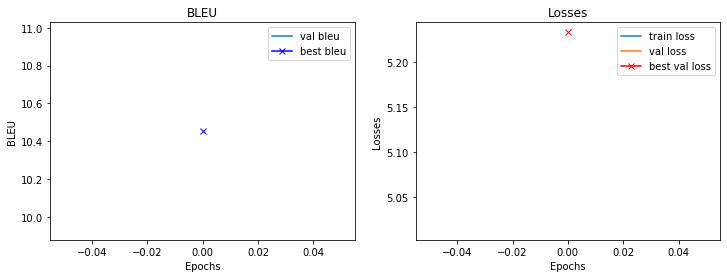

Epoch : 600
Train example :
	Target: a woman with blond-hair pulled in a ponytail steps out of an orange helicopter .
	Output: a man in a and a a red is . a a . . .
Random example:
	Target: three teenagers laying in a field and socializing with each other .
	Output: a man in a red shirt is playing a a field .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is on a red shirt is on a a of a .
Train loss    : 4.28814857562383
Val loss      : 5.4650110602378845
Val bleu      : 10.362256274041522



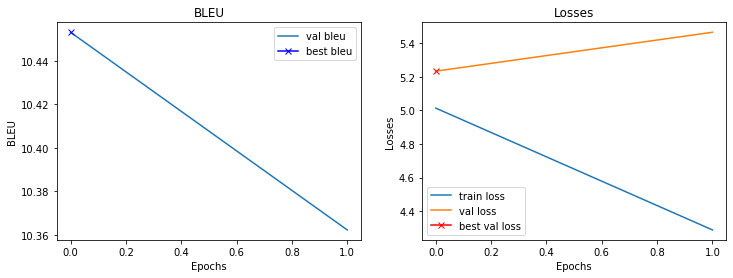

Epoch : 900
Train example :
	Target: a man with glasses playing a silver guitar .
	Output: a man in a is playing guitar guitar .
Random example:
	Target: a man climbs up an artificial climbing wall .
	Output: a young boy is playing on the air .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is sitting on a a a a .
Train loss    : 4.044886065324148
Val loss      : 5.584486469626427
Val bleu      : 15.527029077052196



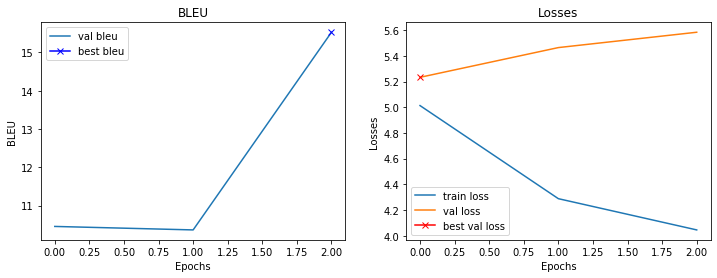

Epoch : 1200
Train example :
	Target: a boy pets a sleeping tiger .
	Output: a woman in a brown shirt and
Random example:
	Target: a little girl wearing a white and red outfit is taking a picture of an adult .
	Output: a group of people are walking down a street .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man in a blue shirt is standing on a a boat .
Train loss    : 3.9018732420603435
Val loss      : 5.809417083859444
Val bleu      : 10.677646300905836



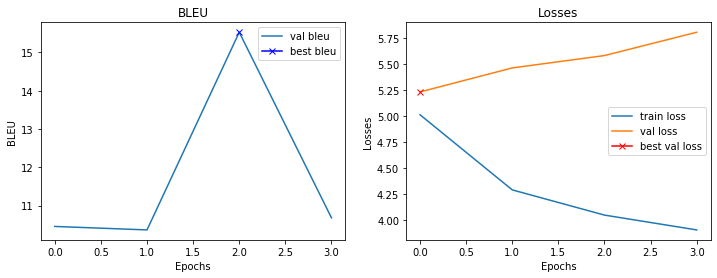

Epoch : 1500
Train example :
	Target: a race car zooms while onlookers watch .
	Output: a car car is a a in .
Random example:
	Target: 2 young people in the middle of a crowded area are playing music .
	Output: a group of people are walking down a street .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is a a a a a blue shirt .
Train loss    : 3.768567702770233
Val loss      : 5.684889018535614
Val bleu      : 14.555642987909929



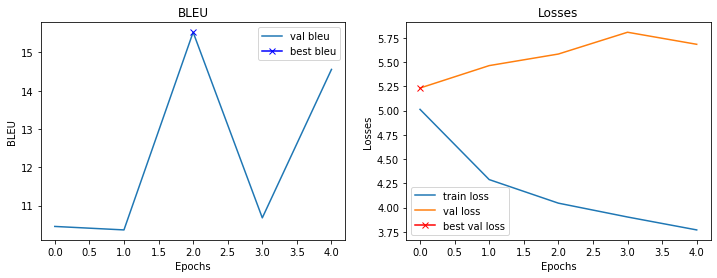

Epoch : 1800
Train example :
	Target: a woman wearing a purple jacket stands next to a horse .
	Output: a woman in a red shirt and on to a horse .
Random example:
	Target: a man walking along the platform at a subway station .
	Output: a man is sitting on a bench with a building .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is sitting on a dock .
Train loss    : 3.6846265689531963
Val loss      : 5.871975466609001
Val bleu      : 10.650235125264151



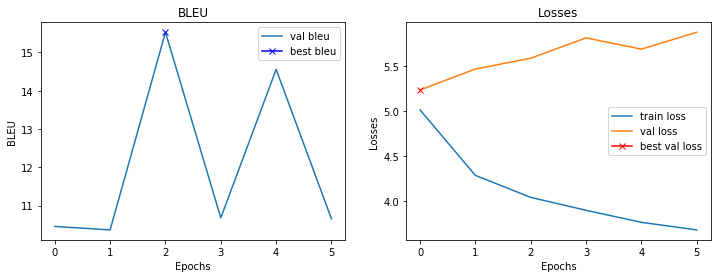

Epoch : 2100
Train example :
	Target: many people sitting at many tables .
	Output: a people are at a table .
Random example:
	Target: a man in a dark shiny suit plays the piano and sings on stage .
	Output: a man in a black shirt and a black shirt and a black shirt and a black shirt and a black shirt and a black shirt , a black shirt , a black shirt and a black shirt
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a blue shirt is jumping into a pool .
Train loss    : 3.616235795021057
Val loss      : 5.915536314249039
Val bleu      : 14.018420932840279



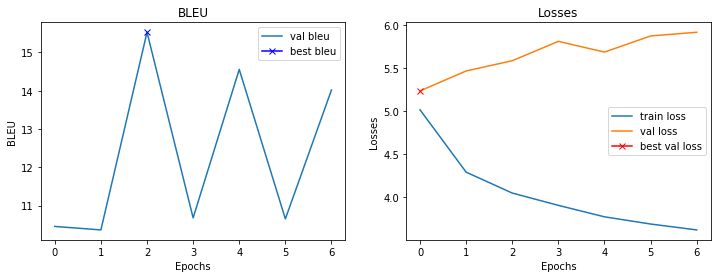

Epoch : 2400
Train example :
	Target: a boy is playing in a dark theater near the stage .
	Output: a man in standing on a blue room . a street .
Random example:
	Target: a woman in a gray , long-sleeved shirt uses a machine at the gym .
	Output: a man in a black shirt is standing in front of a building .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man in a blue shirt is playing a a pool .
Train loss    : 3.5619002906481425
Val loss      : 5.913477882742882
Val bleu      : 13.58339992396088



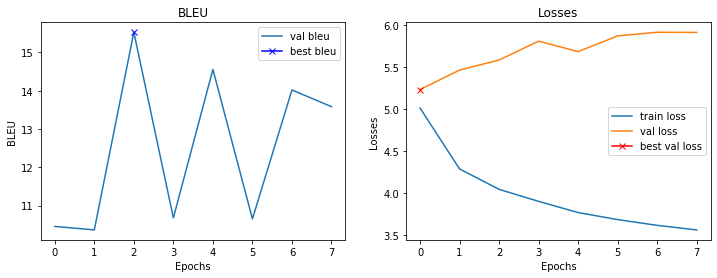

Epoch : 2700
Train example :
	Target: a woman in red is sitting on a bench .
	Output: a woman sitting a and sitting on a bench .
Random example:
	Target: a person surfs through a wave as it crashes down .
	Output: a person is standing on a large boat .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: two people are sitting on a boat .
Train loss    : 3.5258779430389406
Val loss      : 5.8585309237241745
Val bleu      : 16.76811879785649



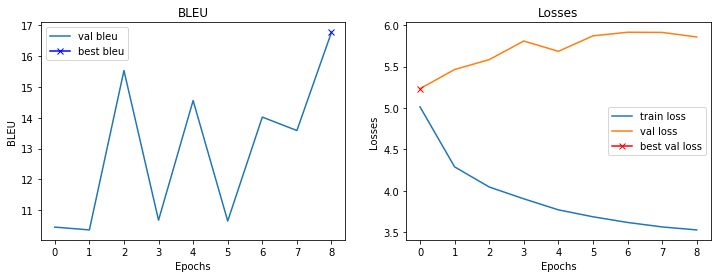

Epoch : 3000
Train example :
	Target: a boy is doing a skateboard trick on the boardwalk .
	Output: a man jumping jumping a skateboard trick on a ground .
Random example:
	Target: some people walking by the water .
	Output: a man in a black jacket is walking down a sidewalk .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a blue shirt is standing on a wooden wall .
Train loss    : 3.4742354774475097
Val loss      : 5.840075954794884
Val bleu      : 17.713505454862364



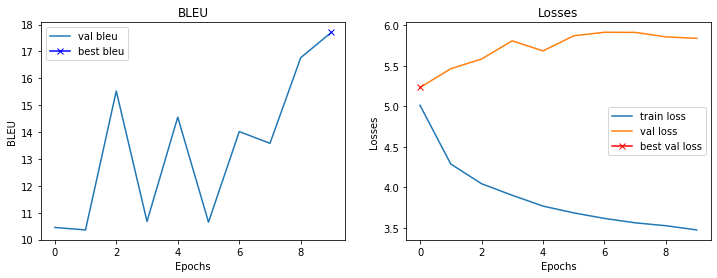

Epoch : 3300
Train example :
	Target: a long-haired man wearing a blue shirt and dark pants plays a guitar while sitting on a wood and metal bench with another man and woman in front of a UNK cafe rainbow mural .
	Output: a man man is a white shirt and a pants is with guitar . a on a bench wall a building . a man . a man the of him UNK . . . .
Random example:
	Target: a little girl in a paisley dress runs across a sandy playground .
	Output: a young girl in a pink shirt and blue shorts is playing a a toy .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a black shirt is standing on a wooden bench .
Train loss    : 3.4485153579711914
Val loss      : 6.0457312017679214
Val bleu      : 16.766976103489668



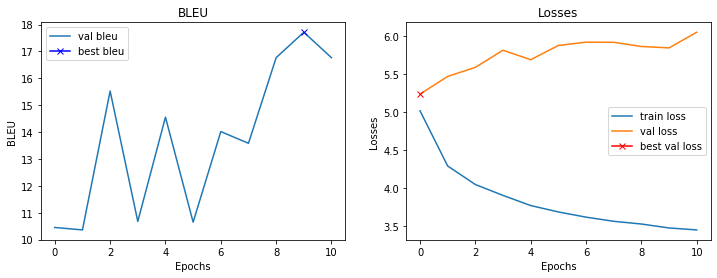

Epoch : 3600
Train example :
	Target: the boy is surfing .
	Output: a man is surfing in
Random example:
	Target: two cheerleaders in dark blue pants and bra style top with yellow pompoms mid cheer .
	Output: a woman in a yellow shirt is holding a ball .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is a a boy in a pool .
Train loss    : 3.3801817075411478
Val loss      : 5.8812485486269
Val bleu      : 16.22057757496192



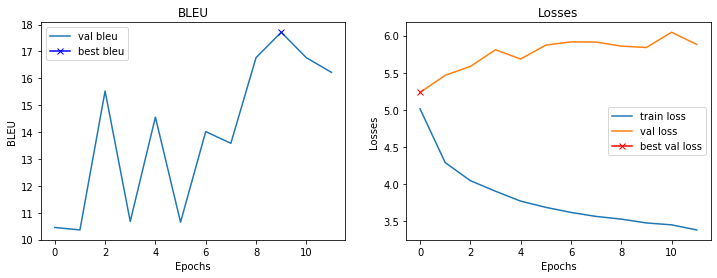

Epoch : 3900
Train example :
	Target: two men wearing work attire , stands next to an UNK , outside a large plant .
	Output: a men in a hats are one man to a orange . one of building . .
Random example:
	Target: a child with a helmet jumps over a pile of old tires .
	Output: a man in a white shirt is standing on a tree .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man in a red shirt is standing in a pool .
Train loss    : 3.3523906501134237
Val loss      : 6.036145702004433
Val bleu      : 16.556794690115936



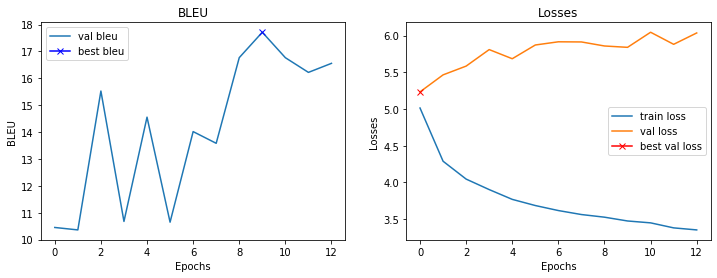

Epoch : 4200
Train example :
	Target: the cowboy is trying to take down the calf .
	Output: a horse rider is to a a a rodeo .
Random example:
	Target: two young people riding skateboards pass by in the street as a black dog on a red leash stops in a doorway and squats down on the sidewalk .
	Output: a man in a black shirt and black pants is walking down a sidewalk .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man in a blue shirt is standing on a wooden wall .
Train loss    : 3.3335641702016194
Val loss      : 6.090569511055946
Val bleu      : 17.4717597616284



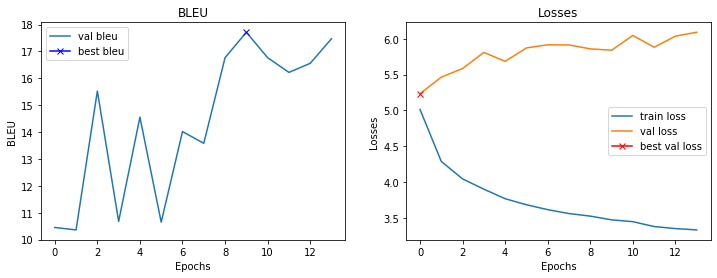

Epoch : 4500
Train example :
	Target: a black and white dog jumps over a bar .
	Output: a black dog white dog is over a hurdle .
Random example:
	Target: two men in suits are on a stage giving a presentation .
	Output: a man in a black shirt is playing a guitar .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two men are playing in a pool .
Train loss    : 3.293549004395803
Val loss      : 6.00679250061512
Val bleu      : 18.728886171756574



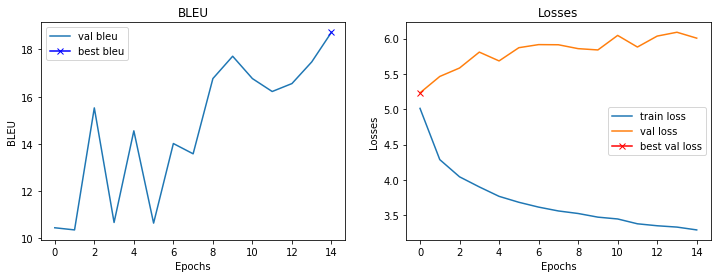

Epoch : 4800
Train example :
	Target: olympic bicyclists round a corner during competition .
	Output: a bikers are in red . . .
Random example:
	Target: six men sit in a field of crops containing wooden crates .
	Output: a group of people are sitting on a grassy field .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is a a child in a pool .
Train loss    : 3.2776782496770225
Val loss      : 6.0495429784059525
Val bleu      : 18.291089528942457



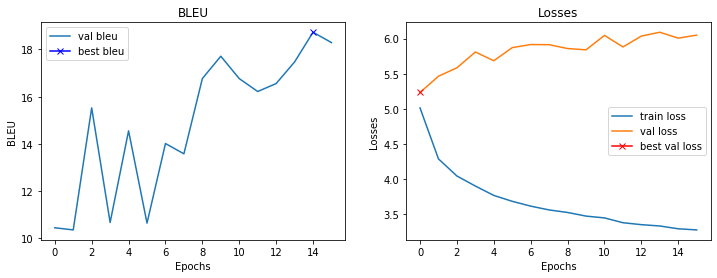

Epoch : 5100
Train example :
	Target: people are inside a cage riding horses .
	Output: a are a of rodeo with a .
Random example:
	Target: a small child on a UNK swing ride at an amusement park .
	Output: a man in a red shirt is standing on a carnival .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is a child in a pool .
Train loss    : 3.2432224631309508
Val loss      : 6.041656568646431
Val bleu      : 17.70875785361265



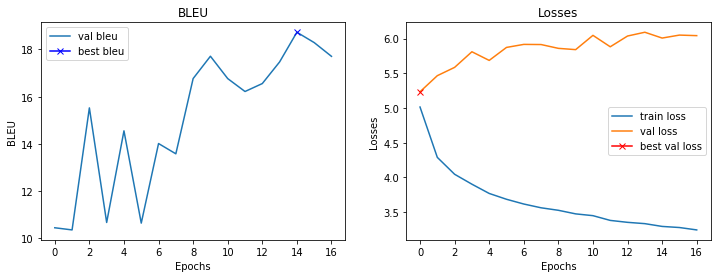

Epoch : 5400
Train example :
	Target: a man in a new york shirt waits to cross the street .
	Output: a man in a black york shirt is for a the street .
Random example:
	Target: two workers in yellow vests try to fix something .
	Output: a man in a green shirt and a hat is standing on a roof .
Fixed example :
	Target: a group of children learning to swim .
	Output: two men are sitting on a wooden wall .
Train loss    : 3.2249855176607767
Val loss      : 6.052594214677811
Val bleu      : 18.20792072141428



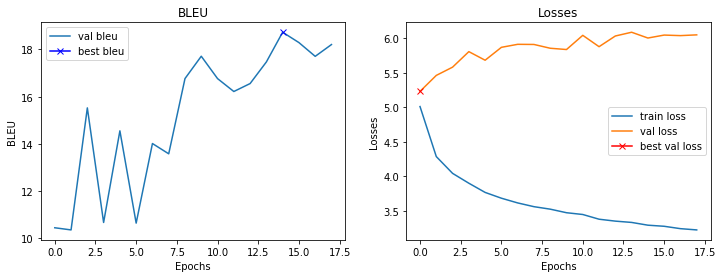

Epoch : 5700
Train example :
	Target: a man and a woman holding a camera are interacting in a chinatown marketplace .
	Output: a group and a woman walking a shopping . walking in a crowded . .
Random example:
	Target: a man is walking past a latin american produce shop .
	Output: a man is selling a fruit .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is sitting on a wooden wall .
Train loss    : 3.21492506980896
Val loss      : 6.017966523766518
Val bleu      : 17.685263691836788



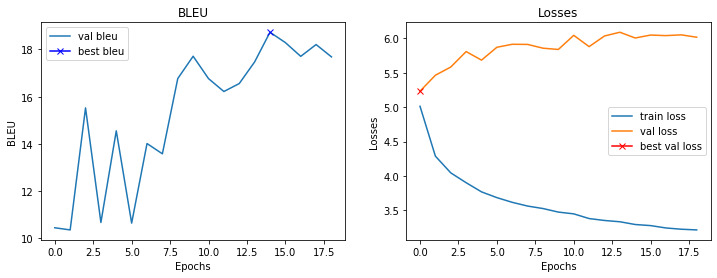

Epoch : 6000
Train example :
	Target: a woman pulls her raft into the water .
	Output: a woman in a hair on a water of
Random example:
	Target: families are gathered in a park .
	Output: a man in a white shirt is sitting on a grass in front of a tree .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is sitting on a wooden wall .
Train loss    : 3.179545508225759
Val loss      : 5.969322472810745
Val bleu      : 18.64680972233737



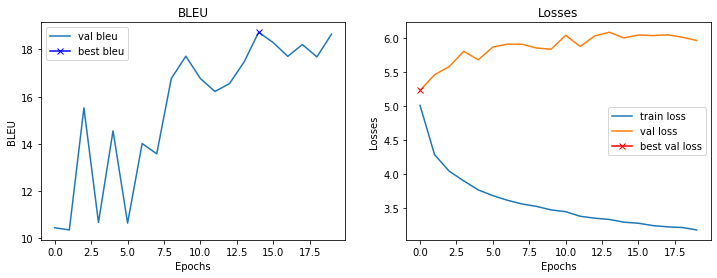

Epoch : 6300
Train example :
	Target: a man skis down a snowy hill .
	Output: a man in in a snowy mountain .
Random example:
	Target: a soccer player removes his shirt .
	Output: a soccer player in a green shirt and a white uniform is running in the field .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a hat is sitting on a wooden structure .
Train loss    : 3.1658457120259604
Val loss      : 6.0828308165073395
Val bleu      : 18.69224804945287



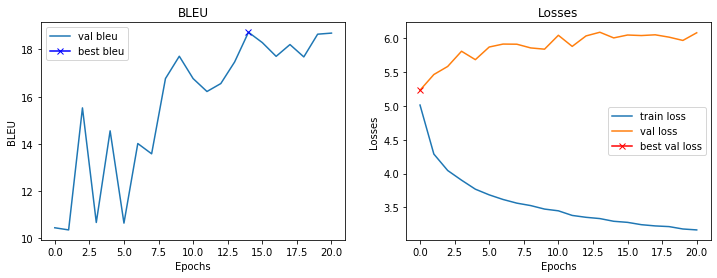

Epoch : 6600
Train example :
	Target: a shirtless man in front of a weathered brick wall outside .
	Output: a shirtless man in a of a construction wall wall . .
Random example:
	Target: a man wearing a number 3 jersey is about to kick a soccer ball .
	Output: a soccer player in a white jersey is about to hit the ball .
Fixed example :
	Target: a group of children learning to swim .
	Output: a group of people are sitting on a wooden floor .
Train loss    : 3.1298986450831094
Val loss      : 6.126086935400963
Val bleu      : 17.332892890047617



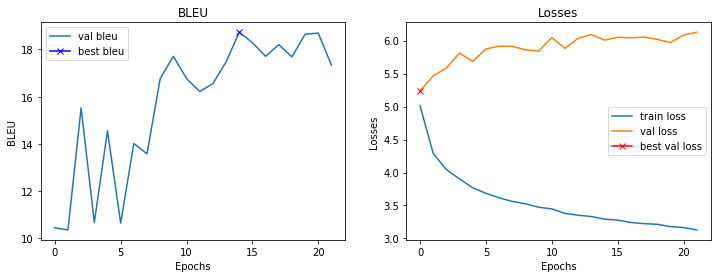

Epoch : 6900
Train example :
	Target: a woman with red-hair and a black shirt has her eyes closed and a mirror behind her .
	Output: a girl with a is a black shirt is a mouth . . a woman . her .
Random example:
	Target: two young women posing for a picture
	Output: a woman in a black dress is posing for a picture .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is sitting on a dock with a net .
Train loss    : 3.1372608653704326
Val loss      : 6.000305280089378
Val bleu      : 18.638419558357175



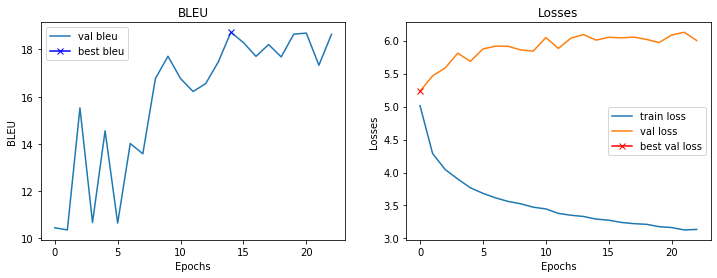

Epoch : 7200
Train example :
	Target: two men talk to each other behind an organ while a lone woman stands to their right .
	Output: a man are to a other on a open . a man man in behind him him .
Random example:
	Target: a dog with one ear up runs outside through the fall leaves .
	Output: a dog is running through a forest .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a red shirt is sitting on a wooden floor .
Train loss    : 3.10933473666509
Val loss      : 6.182387501001358
Val bleu      : 17.890091934150025



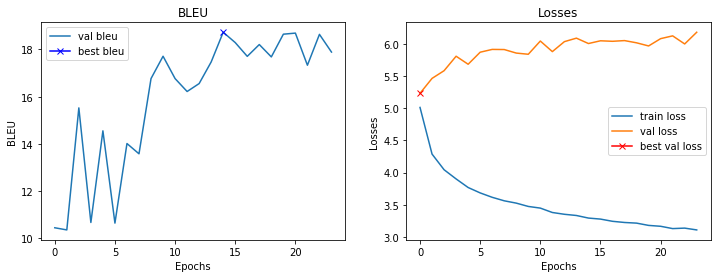

Epoch : 7500
Train example :
	Target: the new york city streets filled with UNK of people .
	Output: a crowd york city street . with people . people .
Random example:
	Target: a man in black pants and a white shirt crossing a bridge in front of a tan building .
	Output: a man in a black shirt and a hat is standing on a boat in front of a building .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a black shirt and a hat is standing on a wooden structure .
Train loss    : 3.114800736904144
Val loss      : 6.075728893280029
Val bleu      : 18.459868292100285



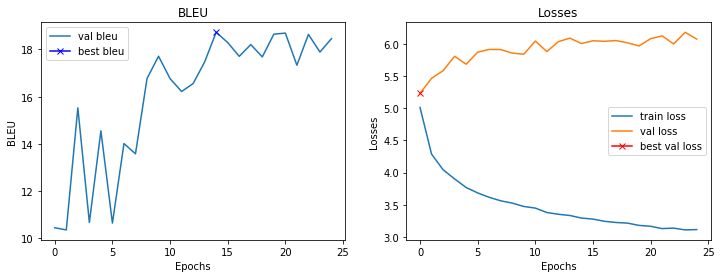

Epoch : 7800
Train example :
	Target: young girl sips a drink on a blue bench .
	Output: a girl in on picture . a park day .
Random example:
	Target: two people sit on a couch overlooking the view of a city .
	Output: a woman in a black shirt and a woman in a black shirt and a woman in a black shirt and a woman in a black shirt and a woman in a black shirt and a
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is a a child in a pool .
Train loss    : 3.074165829817454
Val loss      : 6.116188421845436
Val bleu      : 17.90731367840607



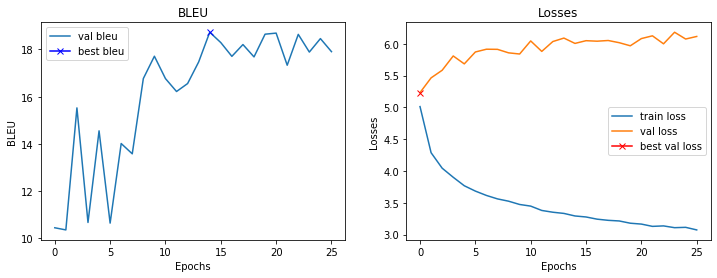

Epoch : 8100
Train example :
	Target: a man sits on a bench near the beach , tying his shoe .
	Output: a man is on a cement . a beach . a a head .
Random example:
	Target: a man in an orange top and blue pants carries a lot of boxes while a woman pulling a pink bag goes in the other direction .
	Output: a man in a blue shirt and black pants is walking down a street .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a yellow shirt is standing on a wooden floor .
Train loss    : 3.083460823694865
Val loss      : 6.122684612870216
Val bleu      : 19.039665467581145



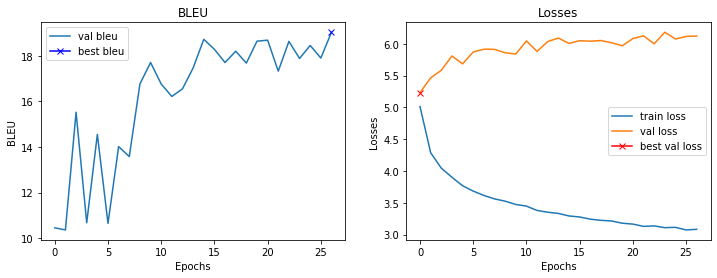

Epoch : 8400
Train example :
	Target: the girl in the blue coat is holding a purple UNK water bottle .
	Output: a young in the green shirt is standing a woman bag . . .
Random example:
	Target: a crowd of people is facing the same direction while some hold their hands in the air .
	Output: a group of people are dancing in a nightclub .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two children are playing in a pool .
Train loss    : 3.083286947409312
Val loss      : 6.068085700273514
Val bleu      : 18.156914148499887



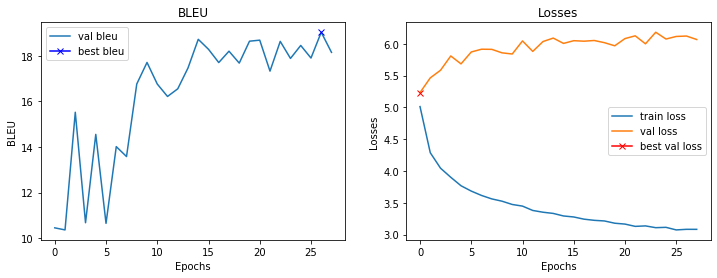

Epoch : 8700
Train example :
	Target: an asian woman dances with long ribbons , she is mid jump with her legs pointed to the right and the red ribbons flowing on either side of her
	Output: a asian woman is in a hula . twirling is twirling . . her arms . . her left . a other . . . her . . her .
Random example:
	Target: a small white kid holding a black umbrella in front of him , in order to block the UNK water being shot out from a red firetruck in the parking lot .
	Output: a woman in a green dress is standing in a fountain .
Fixed example :
	Target: a group of children learning to swim .
	Output: two children are playing in a pool .
Train loss    : 3.0460508569081624
Val loss      : 6.123788490891457
Val bleu      : 17.907124087746595



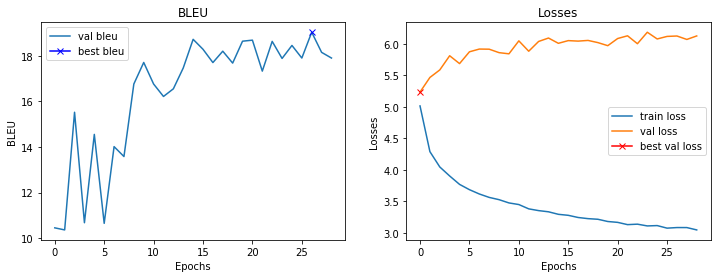

Epoch : 9000
Train example :
	Target: green trees , grass , one man standing , another bending down .
	Output: a dog jumping a , one is is in and man over and
Random example:
	Target: a man with his shirt off standing in a work zone next to a pile of bricks .
	Output: a man in a yellow shirt and a woman in a yellow shirt are standing on a beach .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: three children are playing in a pool .
Train loss    : 3.04937083085378
Val loss      : 6.072111874818802
Val bleu      : 18.682599953676824



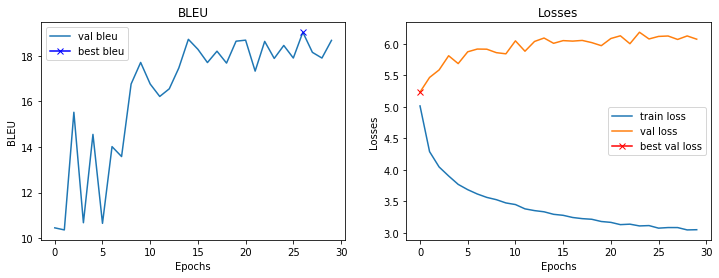

Epoch : 9300
Train example :
	Target: a little girl is licking a dinner plate and getting food all over her face .
	Output: a girl girl is eating a ice . . a bowl . . her . .
Random example:
	Target: a girl dressed for winter stands in front of some graffiti .
	Output: a girl in a pink jacket and a hat is holding a baby .
Fixed example :
	Target: a group of children learning to swim .
	Output: three people are playing in a pool .
Train loss    : 3.0134447757403056
Val loss      : 6.111033782362938
Val bleu      : 18.15831197612667



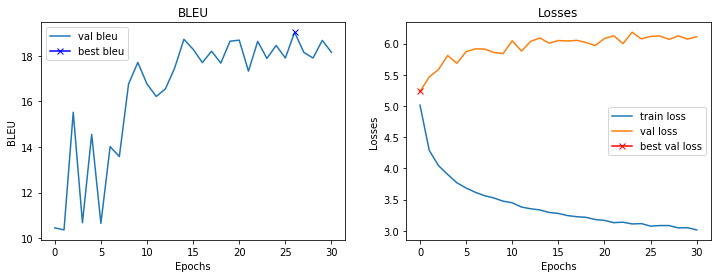

Epoch : 9600
Train example :
	Target: a woman in a blue outfit is upside down with her body UNK .
	Output: a gymnast in a red leotard is jumping on a a legs . .
Random example:
	Target: a cowboy in a rodeo trying to beat the 8 second clock .
	Output: a bull rider is a bucking bronco .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two children are playing in a pool .
Train loss    : 2.9843456244468687
Val loss      : 6.23800802230835
Val bleu      : 18.480844664725293



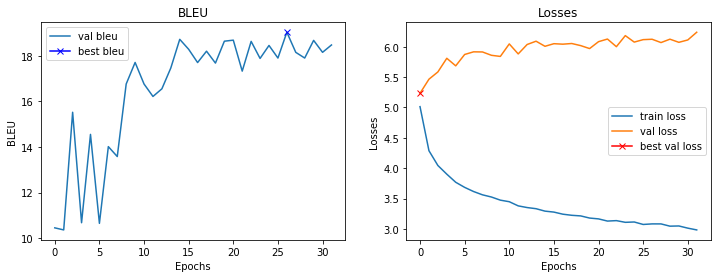

Epoch : 9900
Train example :
	Target: a man is kissing the forehead of a baby that is lying on a couch .
	Output: a man in sitting a baby while a man . is being on a couch .
Random example:
	Target: a man wearing a white shirt taking a nap with a green hat over his eyes .
	Output: a man in a hat and a hat is sitting on a log in a field .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: two men are working on a wall .
Train loss    : 2.969086518287659
Val loss      : 5.993354916572571
Val bleu      : 18.666604104092563



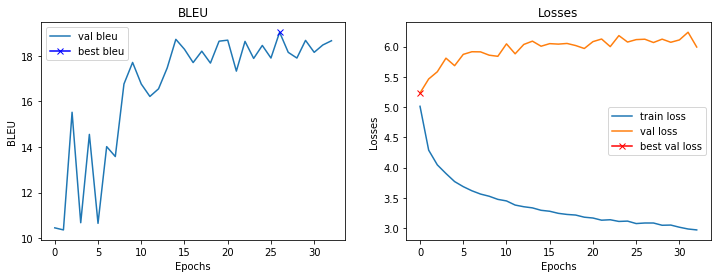

Epoch : 10200
Train example :
	Target: guy in art UNK glass home .
	Output: a in a on .
Random example:
	Target: college students enjoy time out of class in a field .
	Output: a shirtless man is sitting on a grass in a field .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is standing on a wooden floor .
Train loss    : 2.976656978925069
Val loss      : 6.155765146017075
Val bleu      : 19.177576045523033



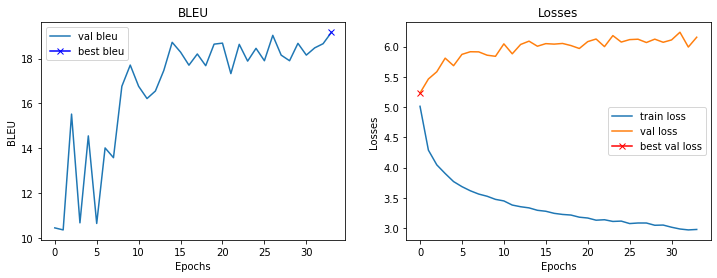

Epoch : 10500
Train example :
	Target: a crowd of people gathered around the exit while a large ship is featured on the tv screen .
	Output: a group of people are in a tv of a tv tv . looking in a screen . .
Random example:
	Target: a man and his children ride a four-wheeler outside .
	Output: a man and a woman are sitting on a bench with a small child in a stroller .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a yellow shirt is standing in a pool .
Train loss    : 2.9945892532666525
Val loss      : 6.119761168956757
Val bleu      : 19.982191539481196



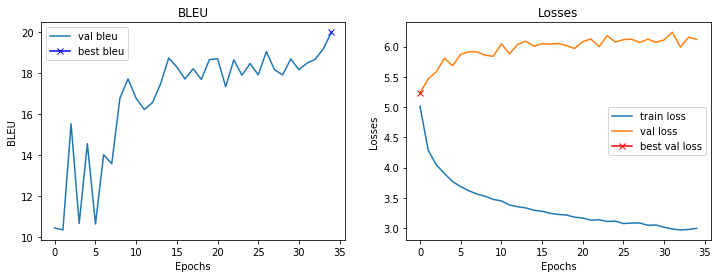

Epoch : 10800
Train example :
	Target: a fluffy white dog runs through the woods with his ears flapping in the breeze .
	Output: a white white dog is through a grass . a mouth . . the air .
Random example:
	Target: two barefoot female ethnic dancers perform in colorful traditional garb .
	Output: a girl in a pink dress is dancing with a girl in a pink dress .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is playing a game of a game .
Train loss    : 2.965855803489685
Val loss      : 6.094820097088814
Val bleu      : 19.52375377050762



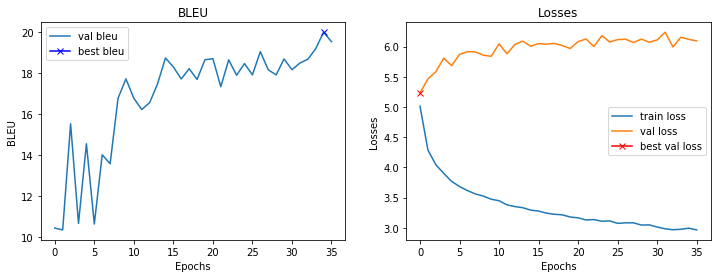

Epoch : 11100
Train example :
	Target: children playing in an outdoor pool as a woman watches from the side .
	Output: a playing in a outdoor fountain .
Random example:
	Target: woman in ethnic garments dancing .
	Output: a woman with a yellow shirt and a yellow shirt is holding a basket .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two men are playing a game of a game .
Train loss    : 2.945156513849894
Val loss      : 6.086724013090134
Val bleu      : 18.81166336939768



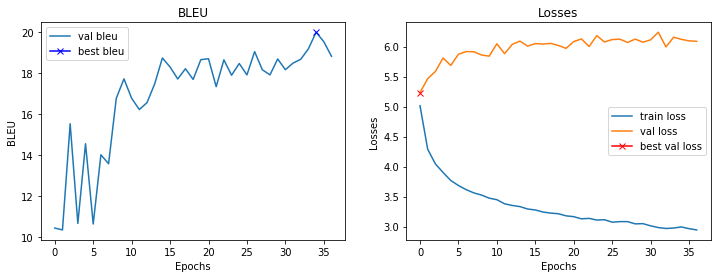

Epoch : 11400
Train example :
	Target: asian men sit on a bench .
	Output: a man in in a bench .
Random example:
	Target: a young woman wearing native dress is working with a frame .
	Output: a woman in a red shirt is sitting on a chair .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: two men are working on a large building .
Train loss    : 2.949275910059611
Val loss      : 6.079887479543686
Val bleu      : 19.45395030818502



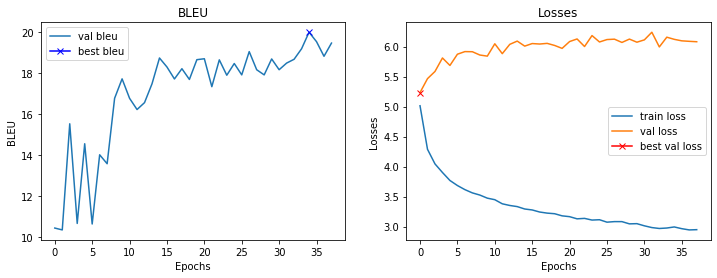

Epoch : 11700
Train example :
	Target: a woman in a white polo shirt is moving a black statue of a bear .
	Output: a man in a white shirt shirt and standing a black statue of a statue statue
Random example:
	Target: a brunette woman wearing dark glasses and a red blouse is eating .
	Output: a woman in a red shirt and a blue shirt is eating a drink .
Fixed example :
	Target: a group of children learning to swim .
	Output: two men are working on a loom .
Train loss    : 2.9266112351417544
Val loss      : 6.136051714420319
Val bleu      : 18.592593458928146



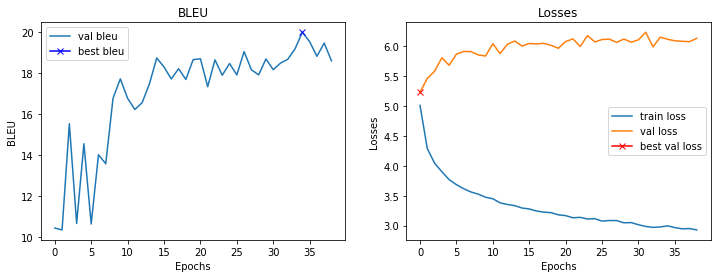

Epoch : 12000
Train example :
	Target: a young man in a hard hat and safety vest sitting in a pickup while another man holds on in the passenger seat .
	Output: a man in in a red hat is standing in and on a car vehicle leaning man is a the the back seat .
Random example:
	Target: a man putting shingles on a roof .
	Output: a man in a blue shirt and jeans is sitting on a stool .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is a blue shirt is standing on a stool .
Train loss    : 2.9293607608477275
Val loss      : 6.12375433743
Val bleu      : 19.964802810021958



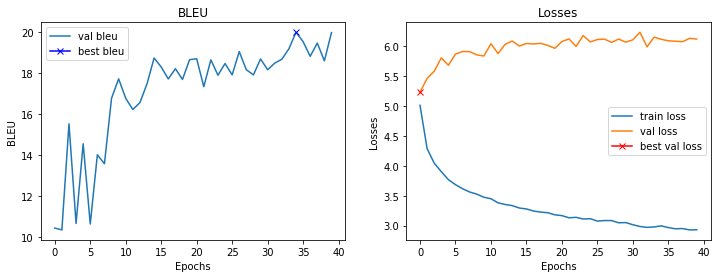

Epoch : 12300
Train example :
	Target: a man in black shorts is boxing against and man in white shorts .
	Output: two man in a shorts and punching . a boxer in the shorts .
Random example:
	Target: a group of women in matching outfits surrounds musicians on a street .
	Output: a man is playing a guitar and a man in a black shirt and jeans .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two men are working on a boat .
Train loss    : 2.9173642063140868
Val loss      : 6.050402268767357
Val bleu      : 19.51722775251427



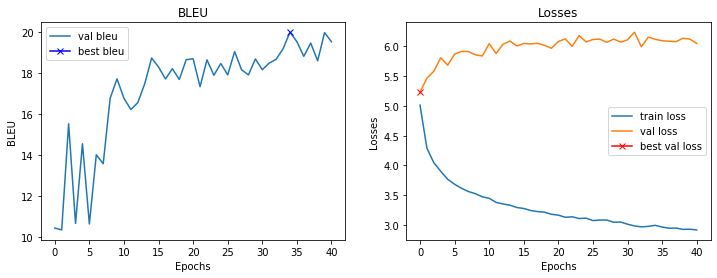

Epoch : 12600
Train example :
	Target: a person in a uniform waiting next to luggage near an open plane door with two other people in the background .
	Output: a man is a black riding on a plane .
Random example:
	Target: a beige dog and brown dog in the snow .
	Output: a dog is playing with a dog .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two men are working on a construction site .
Train loss    : 2.91702232837677
Val loss      : 6.1112562865018845
Val bleu      : 19.405107219897456



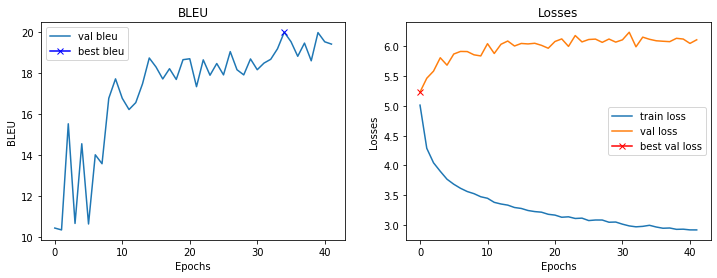

Epoch : 12900
Train example :
	Target: a man dressed as a mariachi player holds a small guitar and sings .
	Output: a man in in a pirate , is a violin guitar . a into
Random example:
	Target: a child in a light blue shirt crying .
	Output: a boy with a blue shirt is holding a white and white striped shirt .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man is a black shirt and a black shirt is playing with a toy .
Train loss    : 2.9140470298131307
Val loss      : 6.196136623620987
Val bleu      : 19.291682421057452



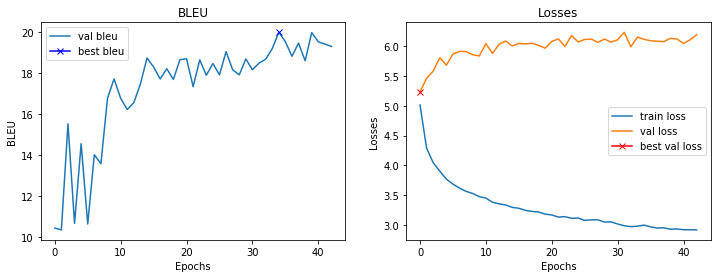

Epoch : 13200
Train example :
	Target: one man , shirtless , and a woman , clothed , jumping in the water .
	Output: a young boy in in in a man in in in and in the water .
Random example:
	Target: a man holding a child 's hand as they walk .
	Output: a man in a blue shirt is standing on a sidewalk .
Fixed example :
	Target: a group of children learning to swim .
	Output: two children are playing in a pool .
Train loss    : 2.886432866255442
Val loss      : 6.142488971352577
Val bleu      : 19.545969014250932



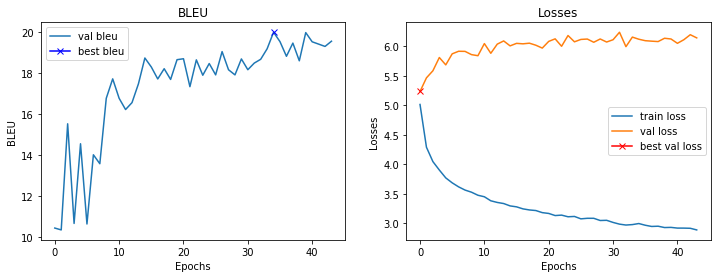

Epoch : 13500
Train example :
	Target: a man known as UNK speaks at a UNK .
	Output: a man in a a UNK to a podium .
Random example:
	Target: a boy runs along a beach while a group of young girls watch .
	Output: a little girl in a pink shirt is playing with a little girl .
Fixed example :
	Target: a group of children learning to swim .
	Output: two children are playing in a pool .
Train loss    : 2.885261050860087
Val loss      : 6.105212420225143
Val bleu      : 20.754871999553806



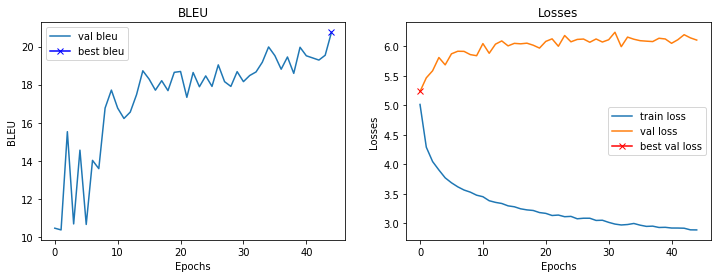

Epoch : 13800
Train example :
	Target: a girl in a red and white costume standing on the street .
	Output: a girl in red red dress white striped is in a street .
Random example:
	Target: two baseball players trying to catch a ball in the outfield .
	Output: a man in a white shirt and white pants is throwing a ball .
Fixed example :
	Target: a group of children learning to swim .
	Output: two children play in a pool .
Train loss    : 2.8738168319066366
Val loss      : 6.150327160954475
Val bleu      : 18.98888540296125



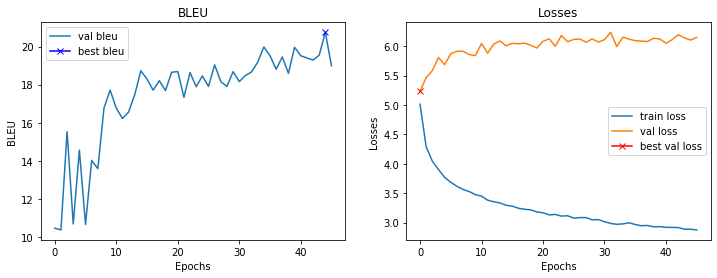

Epoch : 14100
Train example :
	Target: busy marketplace in an arabian country .
	Output: a a a a asian country .
Random example:
	Target: two males are running in an uncrowded area .
	Output: a man is playing a game of a rodeo .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is a yellow shirt is standing on a wall with a man in a yellow shirt and a
Train loss    : 2.8754962627092997
Val loss      : 6.084270313382149
Val bleu      : 19.860897125595358



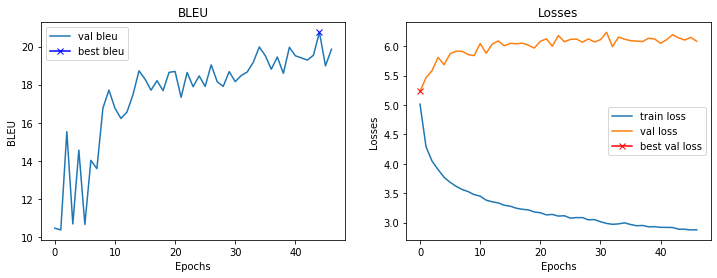

Epoch : 14400
Train example :
	Target: four people playing soccer on a brown surface .
	Output: four men are a on a beach surface .
Random example:
	Target: a tennis player in a red outfit .
	Output: a woman in a red shirt and white shorts is playing tennis .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two children are playing in a pool .
Train loss    : 2.856721637248993
Val loss      : 6.161860719323158
Val bleu      : 19.78674700576077



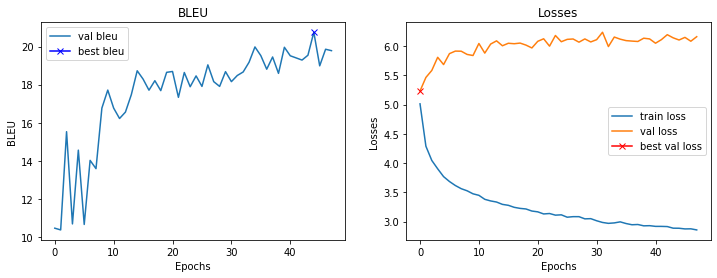

Epoch : 14700
Train example :
	Target: a man wit a green collared shirt and a camera sits at a curb .
	Output: a man in a cigarette shirt and and blue black is on a table .
Random example:
	Target: a UNK street artist draws a caricature of a redheaded woman on the side of the street .
	Output: a woman in a red shirt is sitting on a chair .
Fixed example :
	Target: a group of children learning to swim .
	Output: two children play in a pool .
Train loss    : 2.843489742279053
Val loss      : 6.147219404578209
Val bleu      : 20.15316094338877



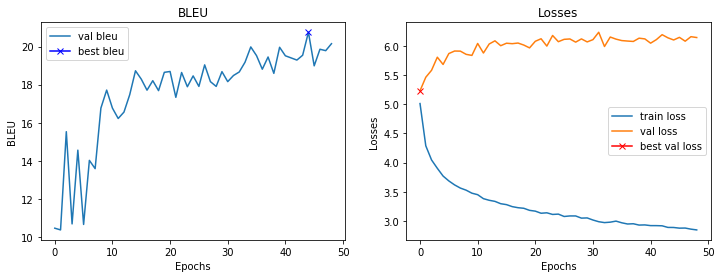

Epoch : 15000
Train example :
	Target: hiker walking along high rocks in front of a blue sky with puffy white clouds .
	Output: a in on rocks rock . the of a mountain sky . a cloudy sky .
Random example:
	Target: two children are running down the sidewalk in front of a building .
	Output: a man in a green shirt is sitting on a sidewalk .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man in a yellow shirt is standing on a wooden floor .
Train loss    : 2.8411218984921773
Val loss      : 6.2090470641851425
Val bleu      : 19.345340608060095



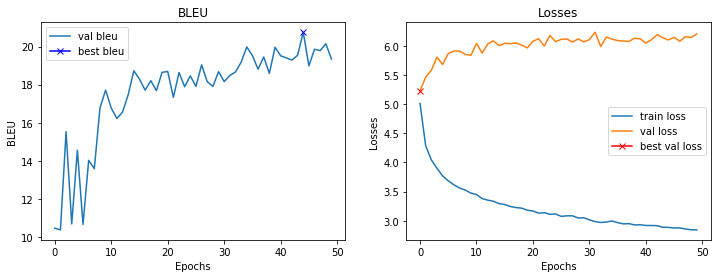

Epoch : 15300
Train example :
	Target: a young girl UNK off by a fountain in a park .
	Output: a woman girl in a of a fountain . a fountain .
Random example:
	Target: a woman in a pink skirt is serving a ball in a tennis game .
	Output: a woman in a white shirt and blue shorts is playing tennis .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two children are playing in a pool .
Train loss    : 2.827464189529419
Val loss      : 6.214666202664375
Val bleu      : 19.518288178809946



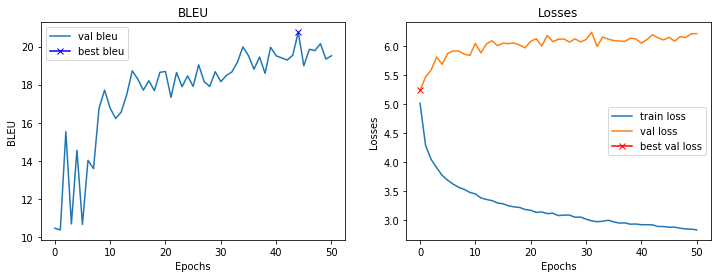

Epoch : 15600
Train example :
	Target: a person is taking a walk on a rocky trail .
	Output: a person in walking a way through a mountain path .
Random example:
	Target: two women , one with tattoos , hold each other and smile .
	Output: a woman and a woman are laughing .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is a yellow shirt is standing on a wall with a man in a blue shirt and a hat .
Train loss    : 2.8162585695584617
Val loss      : 6.298432394862175
Val bleu      : 18.95848890635717



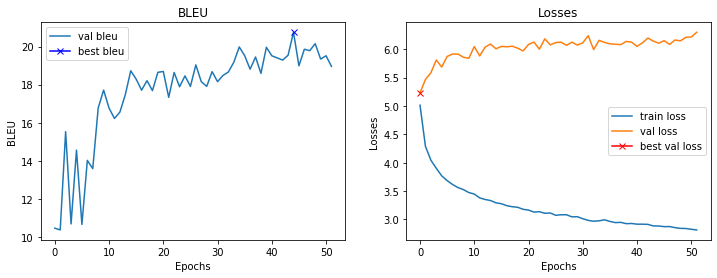

Epoch : 15900
Train example :
	Target: a group of people standing in the water on a sunny day .
	Output: a group of african are in the water . the beach day .
Random example:
	Target: four girls are sitting in a hot tub .
	Output: a man is sitting in a pool with a man in a pool .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man is a yellow shirt is playing a game of a game .
Train loss    : 2.812936205069224
Val loss      : 6.29696986079216
Val bleu      : 18.701532631415326



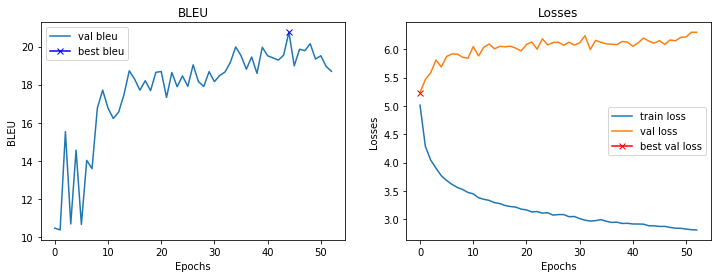

Epoch : 16200
Train example :
	Target: a black limo is parked next to a crowded staircase .
	Output: a woman limousine and parked on to a car street .
Random example:
	Target: two UNK in a field .
	Output: a gray dog is a brown dog in a grassy yard .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a yellow shirt is sitting on a stool .
Train loss    : 2.813558743794759
Val loss      : 6.302199557423592
Val bleu      : 19.33374484338703



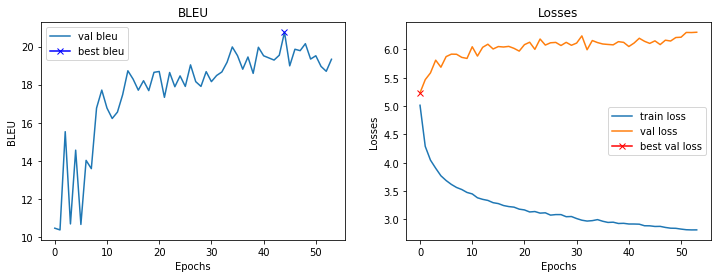

Epoch : 16500
Train example :
	Target: young black girl riding pony at petting zoo .
	Output: a girl and white a white a . .
Random example:
	Target: a woman with a pink shirt walks down the street .
	Output: a man and a woman are sitting on a bench .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man in a yellow shirt is working on a construction site .
Train loss    : 2.8123148568471272
Val loss      : 6.260194435715675
Val bleu      : 19.121617915027876



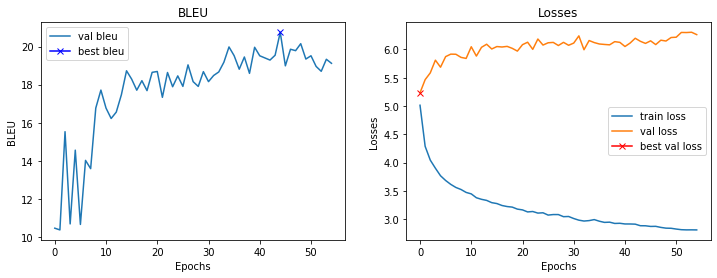

Epoch : 16800
Train example :
	Target: a person rides a bike in front of an elaborately painted building .
	Output: a man riding a bike on a quaint a building building building .
Random example:
	Target: a tall man in a green sweater is holding his hands out at chest height like he is holding a book in a room of 3 people .
	Output: a man in a suit is talking to a woman in a black jacket .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two men are sitting on a boat .
Train loss    : 2.7957184227307637
Val loss      : 6.2758301347494125
Val bleu      : 19.63022381430432



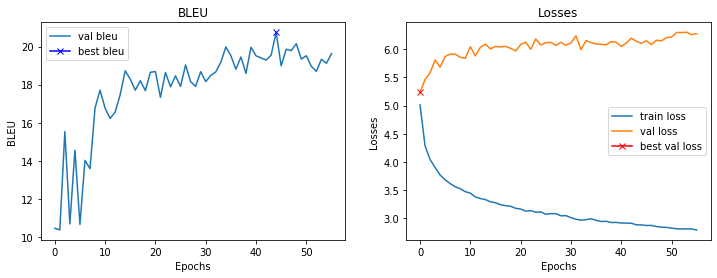

Epoch : 17100
Train example :
	Target: a man rows a boat in a lake near mountains .
	Output: a man is a boat on the lake . a .
Random example:
	Target: three men sit outside of a cafe .
	Output: a group of people sitting at a table with a large white tablecloth .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man is sitting on a stool in a pool .
Train loss    : 2.8045608417193093
Val loss      : 6.325564086437225
Val bleu      : 19.855116535264518



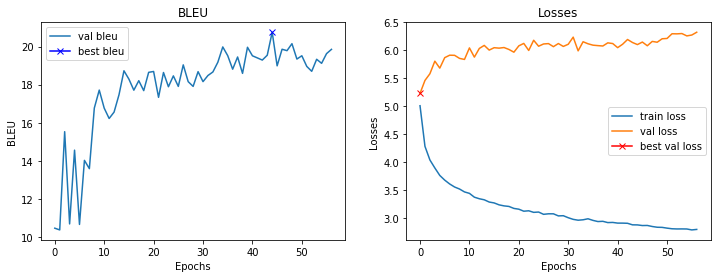

Epoch : 17400
Train example :
	Target: five UNK playing on the street .
	Output: a men members instruments a street .
Random example:
	Target: an old woman in a scarf is in the city .
	Output: a man with a beard and a red shirt is standing in the street .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man is a pool with a UNK .
Train loss    : 2.797227658430735
Val loss      : 6.300203368067741
Val bleu      : 19.189207680734828



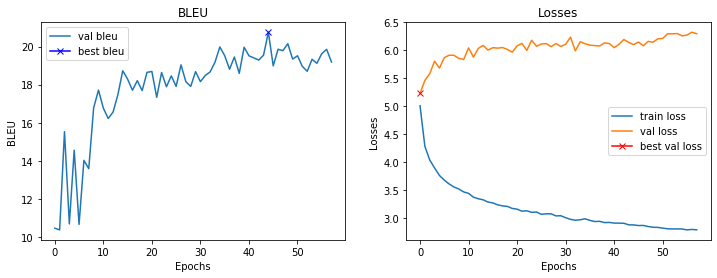

Epoch : 17700
Train example :
	Target: people under a blue umbrella walking .
	Output: a walking a street umbrella and down
Random example:
	Target: a man and child are laughing together .
	Output: a man in a blue shirt is sitting on a couch .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is a red shirt is sitting on a stool in a pool .
Train loss    : 2.763757487932841
Val loss      : 6.3622860461473465
Val bleu      : 18.932049768429057



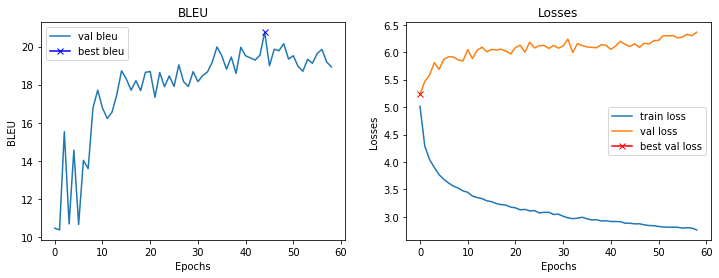

Epoch : 18000
Train example :
	Target: a seagull watches a woman in a sweater and scarf reading the newspaper .
	Output: a woman woman a woman sitting a blue jacket white . a newspaper .
Random example:
	Target: a man wearing all black sits on a wooden bench and reads , his umbrella is open nearby on the ground .
	Output: a man in a red jacket is sitting on a bench in a red umbrella .
Fixed example :
	Target: a group of children learning to swim .
	Output: two children are playing in a pool .
Train loss    : 2.7862857643763226
Val loss      : 6.313612654805183
Val bleu      : 19.59833167979594



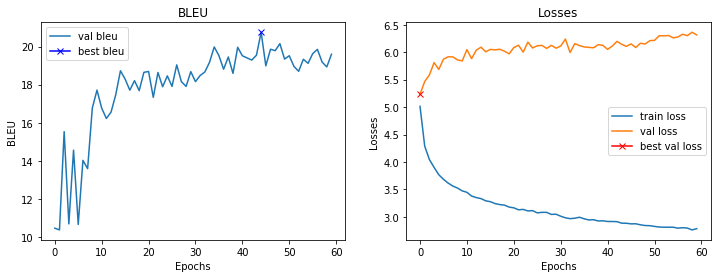

Epoch : 18300
Train example :
	Target: customers shopping in food court market .
	Output: a are in a at . .
Random example:
	Target: the man in a blue shirt , wearing a helmet , is readying to climb .
	Output: a woman climbing a rock wall .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is a yellow shirt is standing in a pool .
Train loss    : 2.765575939019521
Val loss      : 6.251094147562981
Val bleu      : 20.705904323580608



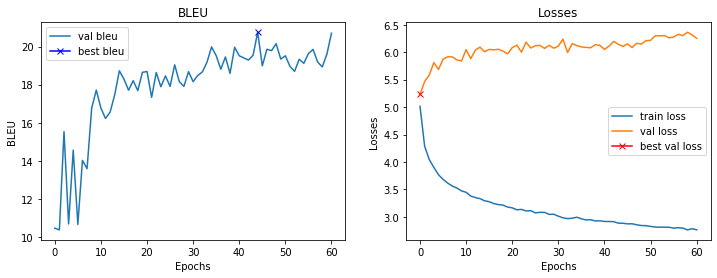

Epoch : 18600
Train example :
	Target: construction workers in overalls working .
	Output: a workers are hard and on
Random example:
	Target: a man and a woman is walking with a dog across a beach
	Output: two dogs run on the beach .
Fixed example :
	Target: a group of children learning to swim .
	Output: two men are working on a construction site .
Train loss    : 2.759934715429942
Val loss      : 6.178082749247551
Val bleu      : 20.058428232969497



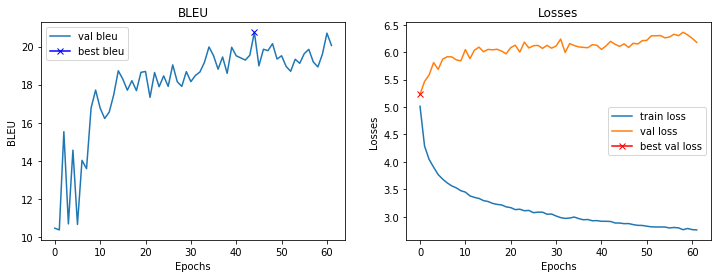

Epoch : 18900
Train example :
	Target: a lady is wearing jeans and a cardboard costume designed to look like the cartoon character UNK
	Output: a group in walking a UNK a crowd sign .
Random example:
	Target: a group of UNK are walking in the city .
	Output: a man in a red shirt and red hat is walking down the street .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two children are playing with a toy .
Train loss    : 2.7648701238632203
Val loss      : 6.256579473614693
Val bleu      : 19.82452051980184



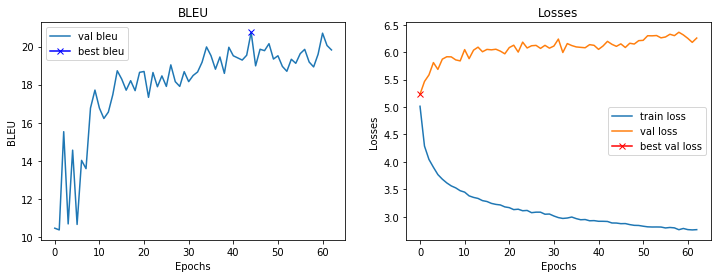

Epoch : 19200
Train example :
	Target: a young teenage girl talks to another teenager with a red sweatshirt .
	Output: a woman woman girl is to a man a a bike shirt .
Random example:
	Target: a man covering a mailbox with a black trash bag .
	Output: a man in a black shirt is looking at a black bag .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two men are playing a game of chess .
Train loss    : 2.742929298877716
Val loss      : 6.317716509103775
Val bleu      : 19.65639451452417



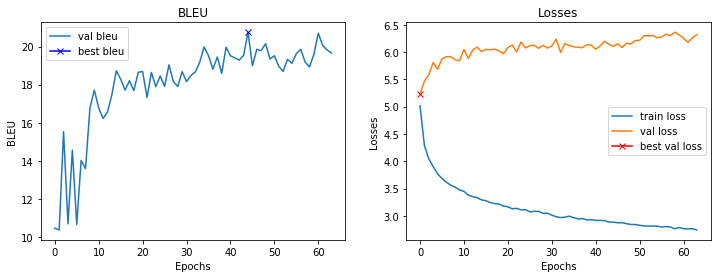

Epoch : 19500
Train example :
	Target: a man grins and holds up a white coffee cup while sitting near a tree .
	Output: a man with while his a a cup cup . . a on a tree .
Random example:
	Target: a woman in a brown , UNK jacket and green boots watches some activity high in the grating along a quiet street .
	Output: a man in a brown jacket and black pants is walking past a gate .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: two men are working on a wall .
Train loss    : 2.7398527018229166
Val loss      : 6.175535961985588
Val bleu      : 19.80901617034495



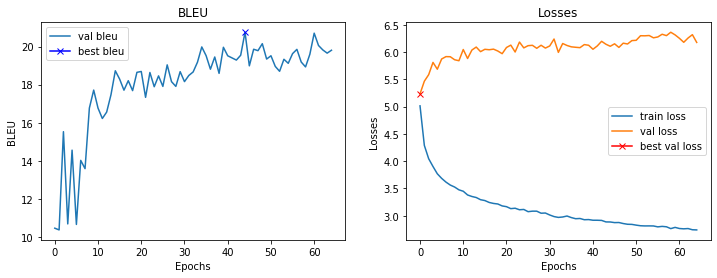

Epoch : 19800
Train example :
	Target: a baby in blue is standing on a sidewalk .
	Output: a woman and a walks walking on a wooden .
Random example:
	Target: a woman wearing a red helmet is holding a rope and smiling .
	Output: a man in a plaid shirt and a red helmet is riding a bike through a wooded area .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man in a yellow shirt is standing on a ladder .
Train loss    : 2.7355482602119445
Val loss      : 6.310895964503288
Val bleu      : 19.637355063953468



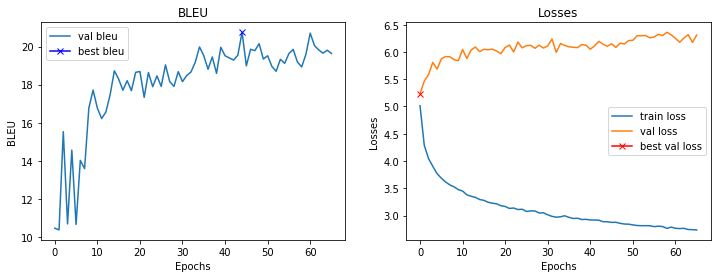

Epoch : 20100
Train example :
	Target: the brown dog is playing with a stick .
	Output: a brown dog is biting with a stick in
Random example:
	Target: a worker rests his foot on the back of a trailer .
	Output: a man in a green shirt and jeans is standing next to a yellow truck .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is cleaning a bucket on a dock .
Train loss    : 2.722107010682424
Val loss      : 6.224346294999123
Val bleu      : 20.081217780640824



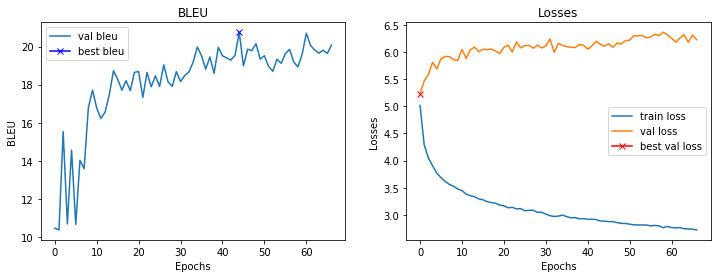

Epoch : 20400
Train example :
	Target: a man in a white t-shirt with a red logo is wearing colored beads whilst carrying a flag past a row of spectators .
	Output: a man in a white shirt and a white shirt is waving a beads . a a flag . a crowd of people .
Random example:
	Target: a little girl is running .
	Output: a girl in a blue dress is playing with a ball .
Fixed example :
	Target: a group of children learning to swim .
	Output: two children are playing in a pool .
Train loss    : 2.7344877107938133
Val loss      : 6.228550747036934
Val bleu      : 19.802966090986313



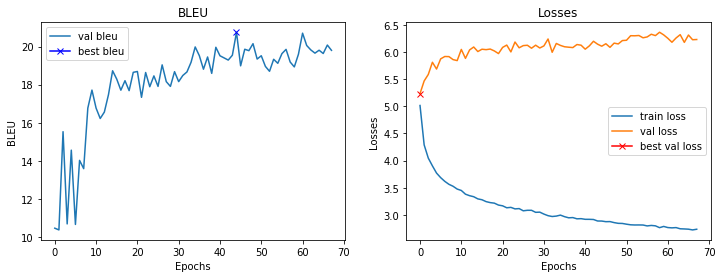

Epoch : 20700
Train example :
	Target: there is a girl creating art in this picture .
	Output: a is a young in a on a microscope .
Random example:
	Target: a young man standing outside of a fire stairway .
	Output: a man is standing on a scaffolding .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: three men are working on a wall .
Train loss    : 2.7011239902178446
Val loss      : 6.311500772833824
Val bleu      : 19.820248189915514



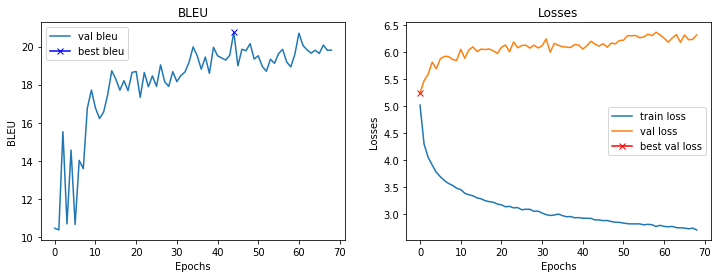

Epoch : 21000
Train example :
	Target: two girls read from a book together .
	Output: two women are on a book . .
Random example:
	Target: a dog running down a paved road .
	Output: a dog is running on the sand .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two children are playing in a pool .
Train loss    : 2.695848706563314
Val loss      : 6.313855439424515
Val bleu      : 20.36224388136354



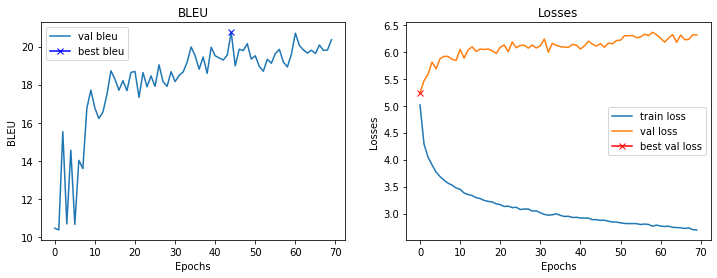

Epoch : 21300
Train example :
	Target: a person is sledding down a hill of snow , with an expression of excitement on their face .
	Output: a young is sledding down a hill . snow . and a adult in snow . her face .
Random example:
	Target: a shirtless man is being filmed in the middle of a soccer field .
	Output: a soccer player in a green uniform is running towards the ball .
Fixed example :
	Target: a group of children learning to swim .
	Output: two men are working on a wall with a yellow bucket .
Train loss    : 2.7132610003153483
Val loss      : 6.301781266927719
Val bleu      : 18.721450190903756



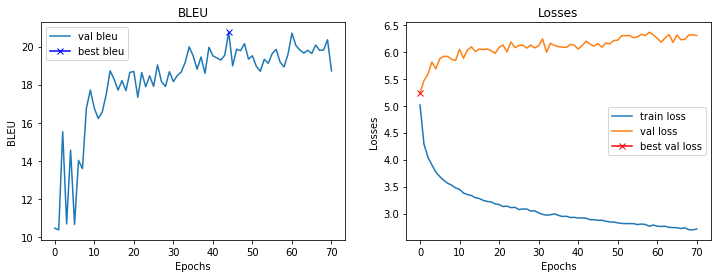

Epoch : 21600
Train example :
	Target: a lady in capri jeans and dark sleeveless top watches some guys preparing for a race .
	Output: a group in a is and a shorts shirt is a people in a a race .
Random example:
	Target: two girls playing at the beach one in pink and the other in black .
	Output: a girl in a pink dress is walking on the beach .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two children are playing with a game of a indoor indoor .
Train loss    : 2.6879615004857382
Val loss      : 6.306587517261505
Val bleu      : 20.56838191164757



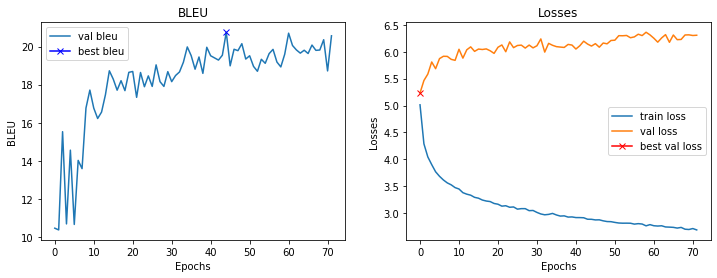

Epoch : 21900
Train example :
	Target: children gather happily around a toy .
	Output: a in around and one baby .
Random example:
	Target: a man playing a xylophone in an open area .
	Output: two women are standing on a patio .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two men are working on a wall .
Train loss    : 2.6774287303288777
Val loss      : 6.27933643758297
Val bleu      : 20.106881720633528



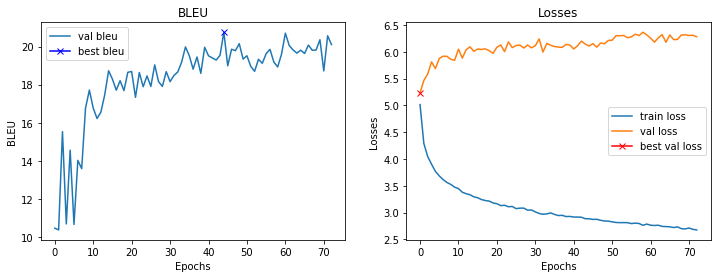

Epoch : 22200
Train example :
	Target: a red uniformed football player tackles an opposing player .
	Output: a football football football player is a opponent team in
Random example:
	Target: four people outside , three of whom are seated males .
	Output: a group of people sitting on a lawn chairs .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: three men are working on a wall .
Train loss    : 2.677457979520162
Val loss      : 6.27970752120018
Val bleu      : 19.925497801878205



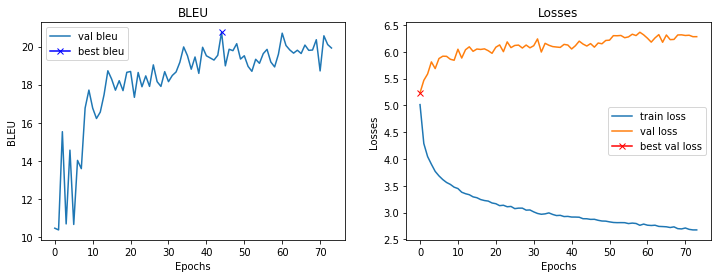

Epoch : 22500
Train example :
	Target: a red-haired clown cries streams of tears in a white hat on stage .
	Output: a man man is into in a . a band hat . a .
Random example:
	Target: old woman in headscarf and glasses stands outside in a big city .
	Output: a man with a red shirt and sunglasses is standing in front of a building .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: three children playing in a pool .
Train loss    : 2.6716287501653038
Val loss      : 6.2771546840667725
Val bleu      : 20.2738368878154



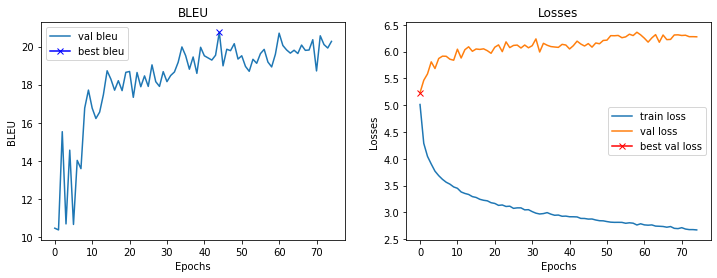

Epoch : 22800
Train example :
	Target: the two dogs are running on the grass .
	Output: two two dogs are playing on the grass .
Random example:
	Target: asian mom holding tiny infant .
	Output: a little girl in a red shirt is holding a baby in a stroller .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is watching a child play with a toy .
Train loss    : 2.6858857456843057
Val loss      : 6.225151970982552
Val bleu      : 19.77828136438108



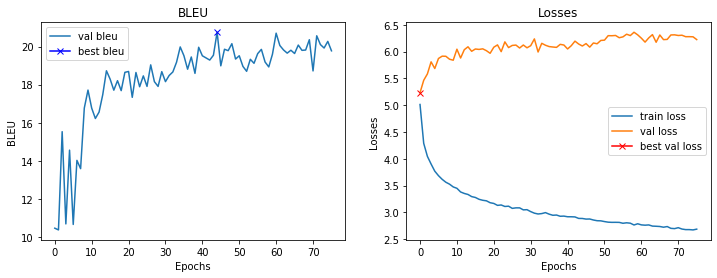

Epoch : 23100
Train example :
	Target: a group of friends stand in front of art they have sprayed for a picture .
	Output: a group of people are on front of a wall stand a spray the picture .
Random example:
	Target: a person on a motorcycle going uphill on rocky terrain
	Output: a man in a red and black helmet is riding a dirt bike .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is a black shirt and jeans is standing on a stool with a guitar and a woman in a red shirt and a woman in a red shirt are watching a game of
Train loss    : 2.678988321622213
Val loss      : 6.34709133207798
Val bleu      : 19.375333061690284



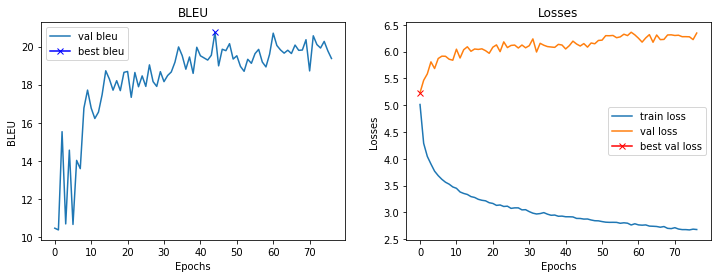

Epoch : 23400
Train example :
	Target: a blond woman with a white tank top and white pants is holding a UNK while standing in a lobby with doors behind her .
	Output: a woman woman in a ponytail hair top is a blue is reading a newspaper on sitting on a bus . a . her .
Random example:
	Target: three dogs run through a manicured lawn .
	Output: two dogs are running in the grass .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: two children are playing in a pool .
Train loss    : 2.678748819033305
Val loss      : 6.226358413696289
Val bleu      : 20.166570633912308



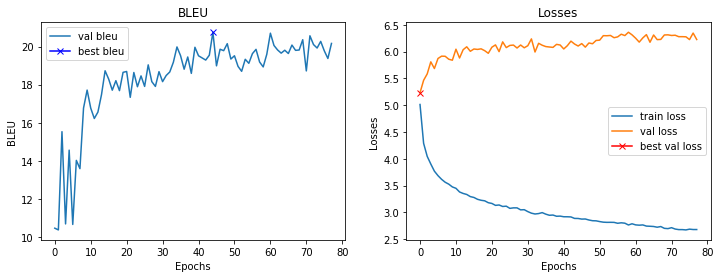

Epoch : 23700
Train example :
	Target: a woman outside of the subway giving directions .
	Output: a woman in a pink phone . a to
Random example:
	Target: a man holding the collar of a young rottweiler .
	Output: a black and brown dog is standing on a ground next to a black dog .
Fixed example :
	Target: a group of children learning to swim .
	Output: three children are playing with a game of checkers .
Train loss    : 2.6347841223080954
Val loss      : 6.294743999838829
Val bleu      : 19.672760996371753



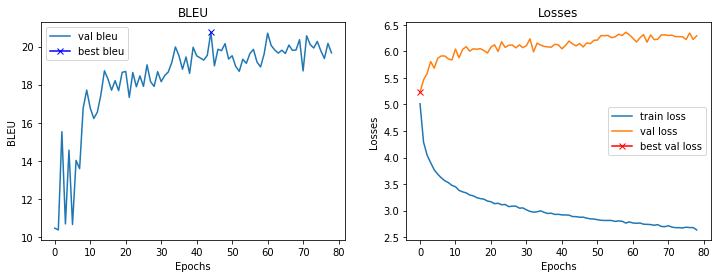

Epoch : 24000
Train example :
	Target: a man and woman wait outside the entrance railing of a subway station outside of a UNK italian restaurant .
	Output: a man in a are for a entrance of of a train station . .
Random example:
	Target: one woman in UNK veil and dress is laughing and conversing with another woman in a white veil and light green dress .
	Output: a man and woman are sitting at a table in a restaurant .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: two men are working in a building .
Train loss    : 2.647853644688924
Val loss      : 6.3097759783267975
Val bleu      : 19.821275345701043



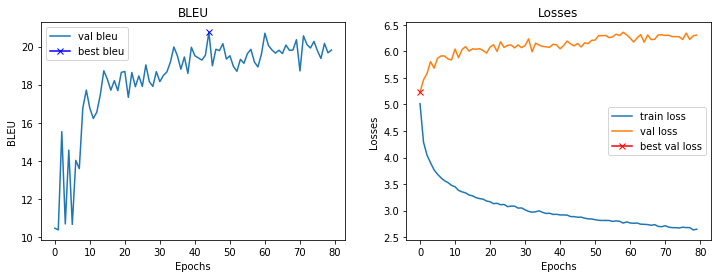

Epoch : 24300
Train example :
	Target: a man stands on a boardwalk with a camera in his hands as a woman in white looks through a telescope over the water towards a large rock outcropping next to a town .
	Output: a woman and on a boardwalk looking a fishing and a dog . they woman looks a looks on . railing . water water . the body of . . to a body of
Random example:
	Target: a boy wearing a blue shirt is touching the trunk of a tree with his finger .
	Output: a boy is climbing a rock .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two men are playing with a ball pit .
Train loss    : 2.644984072049459
Val loss      : 6.315760150551796
Val bleu      : 19.353091184841663



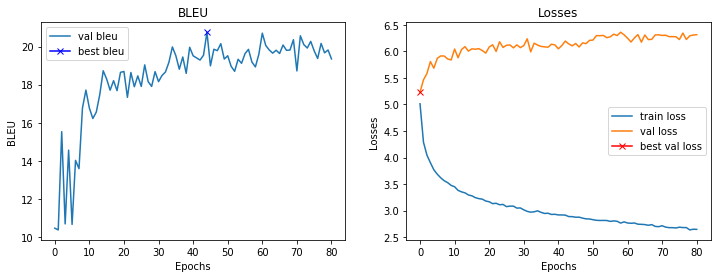

Epoch : 24600
Train example :
	Target: a brown dog is about to catch a treat .
	Output: a brown dog is standing to catch a ball treat
Random example:
	Target: a dog licking its lips while snowfalls .
	Output: a brown and white dog is running through a snow covered path .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two children are playing in a pool .
Train loss    : 2.6598747038841246
Val loss      : 6.215869978070259
Val bleu      : 20.934902151963026



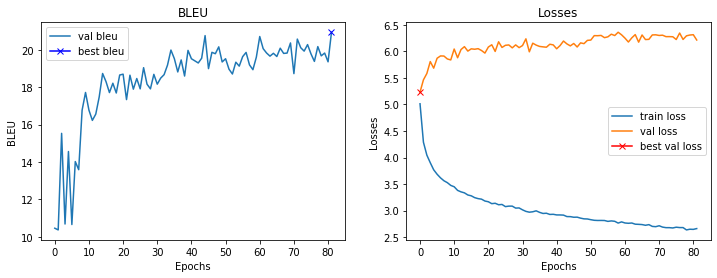

Epoch : 24900
Train example :
	Target: red wall filled with graffiti .
	Output: a man with with graffiti and
Random example:
	Target: the man on the ground in the blue , white , and red jacket is going something to the bike while the other man standing up in the red , white , and blue outfit holds it up .
	Output: a man in a blue jacket is riding a bike through a crowd .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is playing a game of checkers while a man watches .
Train loss    : 2.635578156312307
Val loss      : 6.254141077399254
Val bleu      : 20.17611756636092



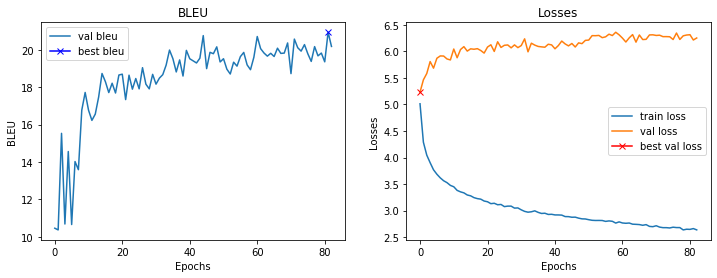

Epoch : 25200
Train example :
	Target: people walking about a university campus with palm trees in the background .
	Output: a are around a campus campus . a trees . the background .
Random example:
	Target: a person doing a leap with his bike over a hill
	Output: a man is doing a trick on a skateboard .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two children are playing in a pool .
Train loss    : 2.6463318141301473
Val loss      : 6.243016317486763
Val bleu      : 20.669124972624502



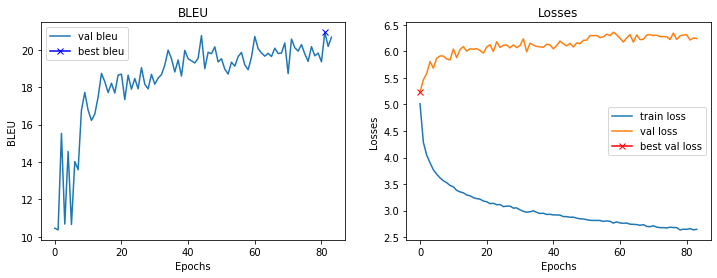

Epoch : 25500
Train example :
	Target: this person is walking down the street and talking on their cellphone on a windy day .
	Output: a woman is wearing down the street . a on her phone . the sidewalk . .
Random example:
	Target: a family hiking down the hill on a cloudy day .
	Output: a man and a woman are walking on a trail .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: two men are a pool .
Train loss    : 2.6217072415351867
Val loss      : 6.378160938620567
Val bleu      : 19.093162837471432



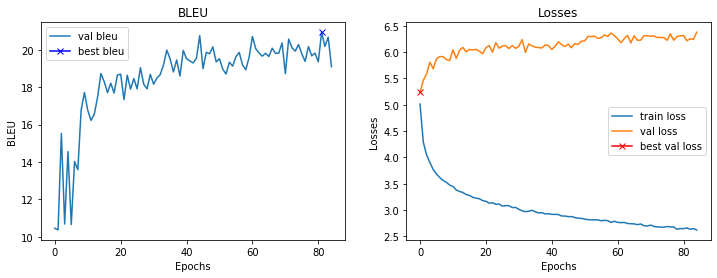

Epoch : 25800
Train example :
	Target: ski equipment sits alone on a snowy mountain
	Output: a equipment with on on a snowy mountain . . . . .
Random example:
	Target: people in UNK going on a boat ride .
	Output: a group of people are in a boat .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: two children are playing with a toy in a pool .
Train loss    : 2.61832719484965
Val loss      : 6.3627742528915405
Val bleu      : 20.847882791089262



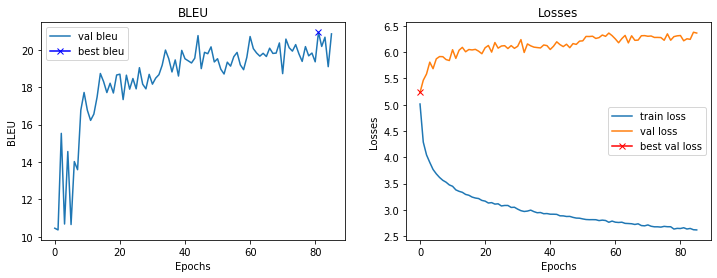

Epoch : 26100
Train example :
	Target: woman in a jacket , walking a small white dog .
	Output: a in red blue walking and down sidewalk red building .
Random example:
	Target: a young woman wearing white clothing is UNK clothes on a clothesline .
	Output: a young boy is holding a piece of a hammer .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: three children are playing in a game of checkers .
Train loss    : 2.6374311820665994
Val loss      : 6.225987136363983
Val bleu      : 19.763954865917032



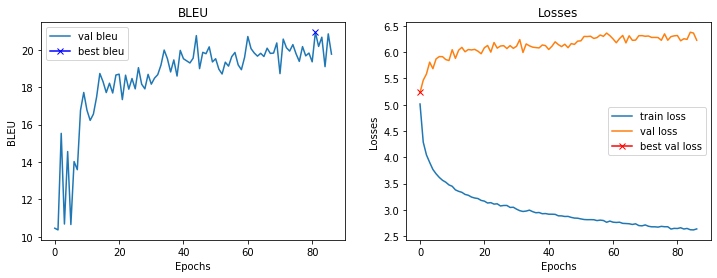

Epoch : 26400
Train example :
	Target: a man plays the bagpipes .
	Output: a man in a military is
Random example:
	Target: a white and brown dog licks his lips during winter .
	Output: a dog is running through the snow .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: two children are playing in a pool .
Train loss    : 2.5954945198694865
Val loss      : 6.355636313557625
Val bleu      : 20.022275694296987



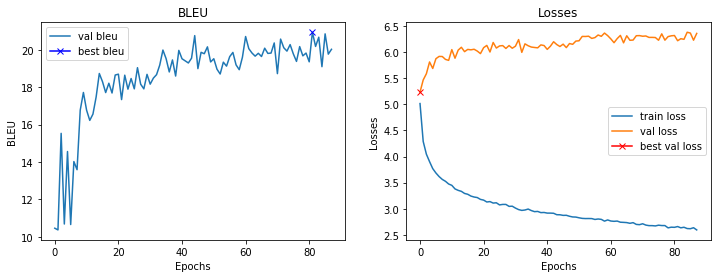

Epoch : 26700
Train example :
	Target: a group of men are gathered in the forest .
	Output: a group of people and a woman a woods .
Random example:
	Target: an older fireman with an orange work suit holding a brown water hose .
	Output: a man in a yellow shirt is walking on the sidewalk .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: two children are playing in a pool .
Train loss    : 2.597259972890218
Val loss      : 6.273169666528702
Val bleu      : 19.9963448725033



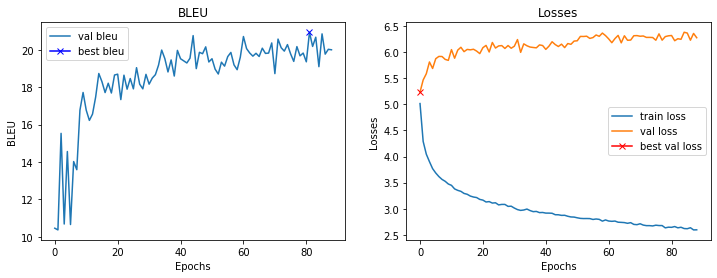

Epoch : 27000
Train example :
	Target: a group of men wait in line to UNK food at a window .
	Output: two group of asian are for a of a a food stand .
Random example:
	Target: a small boy does a handstand on one hand .
	Output: a man in a black shirt and black pants is jumping in the air .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is playing with a toy .
Train loss    : 2.593045746485392
Val loss      : 6.307600811123848
Val bleu      : 20.022776932586986



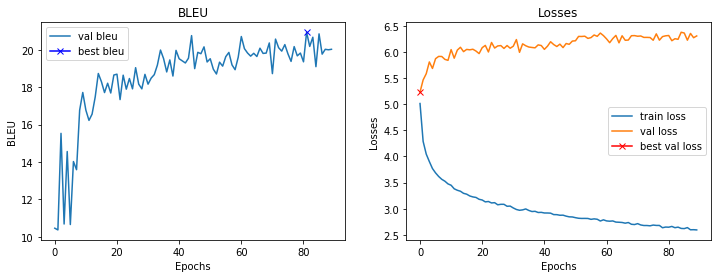

Epoch : 27300
Train example :
	Target: people staring at something in large crowd
	Output: a are at a on the plaza . people . . . . . . .
Random example:
	Target: a brown and black dog fetching a blue toy .
	Output: a dog runs in the dirt .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two children playing in a pool .
Train loss    : 2.5943250616391498
Val loss      : 6.307013392448425
Val bleu      : 20.408314002405874



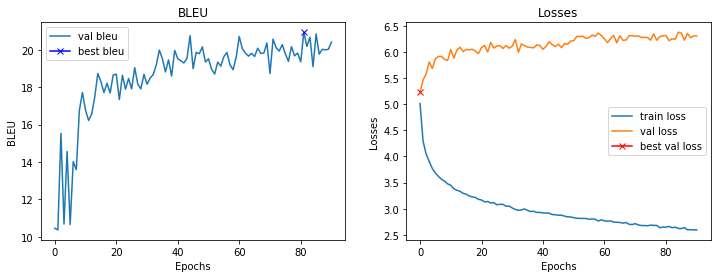

Epoch : 27600
Train example :
	Target: a man practices karate moves in silhouette with a backdrop of a colorful beach sunset .
	Output: a man is a moves on the over a man of a beach backdrop . .
Random example:
	Target: a construction worker siting on a green tractor .
	Output: a man in a green shirt is working on a machine .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two men are playing with a game of chess in a pool .
Train loss    : 2.5872285683949787
Val loss      : 6.318127289414406
Val bleu      : 20.265071922183512



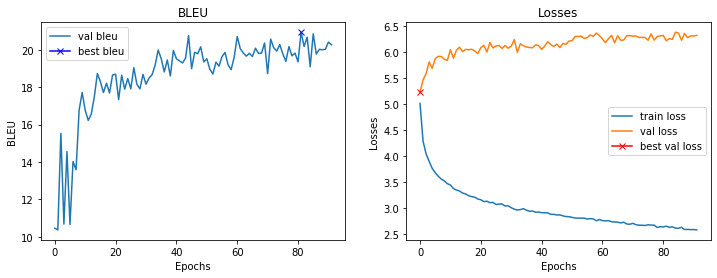

Epoch : 27900
Train example :
	Target: man looks out of second story window .
	Output: a in out window window window window .
Random example:
	Target: a man in a plaid shirt and blue jacket is handing out copies of the " new UNK " .
	Output: a man in a black jacket and black jacket is standing in front of a van .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: two children are playing in a large UNK .
Train loss    : 2.595675743420919
Val loss      : 6.322775155305862
Val bleu      : 19.557335219500164



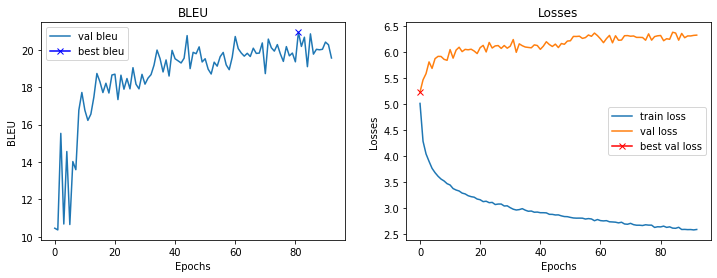

Epoch : 28200
Train example :
	Target: a baseball man playing baseball swings and hits a baseball , while the 4 other men look on .
	Output: a baseball player in baseball . at a baseball baseball bat and a catcher are on are on .
Random example:
	Target: college students enjoy time out of class in a field .
	Output: a shirtless man in a bathing suit is sitting on the grass .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: two men are playing in a game of chess .
Train loss    : 2.579708275794983
Val loss      : 6.445545271039009
Val bleu      : 19.356365555054598



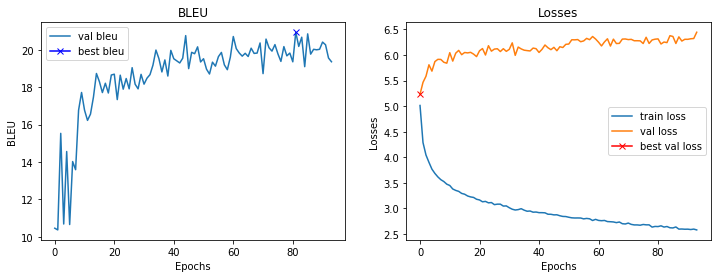

Epoch : 28500
Train example :
	Target: a woman eating food with her hands .
	Output: a woman in a on a hands .
Random example:
	Target: a blond girl and brunette girl walking .
	Output: a woman in a black tank top and jeans is walking down the street .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man is playing a guitar game .
Train loss    : 2.581852623621623
Val loss      : 6.383346199989319
Val bleu      : 19.78288814731617



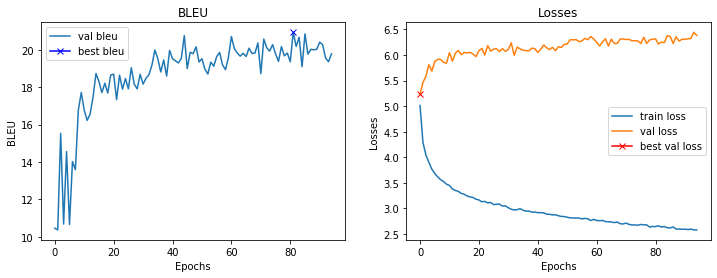

Epoch : 28800
Train example :
	Target: a person on a bike get airborne .
	Output: a man is performing bicycle trick on in
Random example:
	Target: a man in an orange jacket is snowboarding .
	Output: a snowboarder is performing a trick on a snowy slope .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: two children are playing in a large pool .
Train loss    : 2.546305661201477
Val loss      : 6.295508682727814
Val bleu      : 20.593577080675527



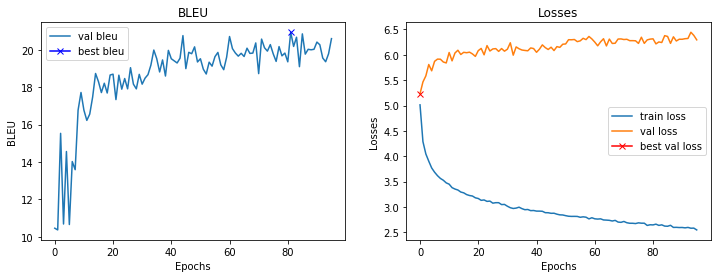

Epoch : 29100
Train example :
	Target: musicians dressed in red and white shirts and khaki pants , performing at a sports arena .
	Output: a performing in red and white playing are playing pants and and on a conference event .
Random example:
	Target: two ladies are walking across the street laughing .
	Output: two women are walking down the street .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two children are playing in a game .
Train loss    : 2.5806255459785463
Val loss      : 6.3127248883247375
Val bleu      : 20.477601872574702



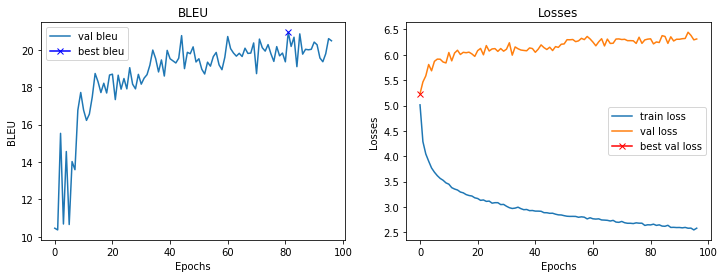

Epoch : 29400
Train example :
	Target: two toddlers , in a stroller , are placed in front of a firetruck .
	Output: a children are in a stroller on one in in a of a red .
Random example:
	Target: this is a group of women playing volleyball in sports bikinis .
	Output: two women are playing volleyball .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two men are working on a boat .
Train loss    : 2.5719947624206543
Val loss      : 6.443092584609985
Val bleu      : 20.727176923070655



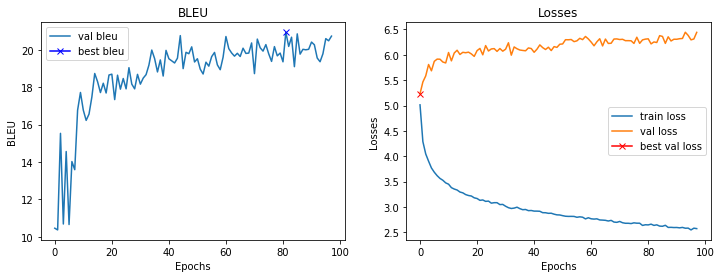

Epoch : 29700
Train example :
	Target: the black dog is walking along a tree trunk bridge over water .
	Output: a dog dog is jumping through the fallen . . . a .
Random example:
	Target: an older woman and a young man play UNK .
	Output: a man and a woman are cutting a meal .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is watching a children play in a pool .
Train loss    : 2.578465931415558
Val loss      : 6.347271382808685
Val bleu      : 20.62923188288171



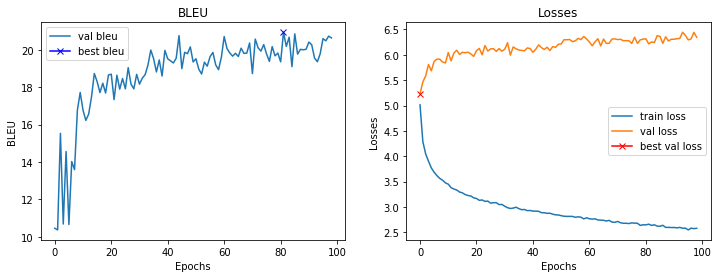

Epoch : 30000
Train example :
	Target: musical band in red light getting ready to perform .
	Output: a band performing red and red ready to play .
Random example:
	Target: a woman lays her head down on a pillow on a shelf in a store .
	Output: a woman is holding a UNK .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is playing a guitar while a man watches .
Train loss    : 2.5508732215563454
Val loss      : 6.277633532881737
Val bleu      : 20.48199903078261



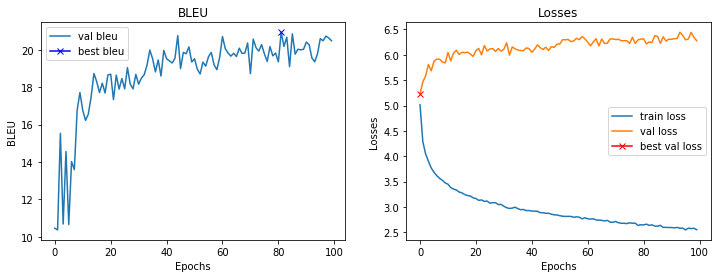

CPU times: user 5h 13min 6s, sys: 37min 54s, total: 5h 51min
Wall time: 5h 10min 2s


In [62]:
%%time
best_bleu = 0
epoch_loss = 0
train_losses = []
val_losses = []
bleu = []
tf = 0.9

for epoch in range(1, max_epochs+1):

  image_vectors, captions_ix = generate_batch(train_dataset, batch_size)
  image_vectors, captions_ix = image_vectors.to(device), captions_ix.to(device)

  captions_ix_next = captions_ix[:, 1:].contiguous()

  network.train()
  network.encoder.eval()

  optimizer.zero_grad()
        
  outputs, atts = network(image_vectors, captions_ix, teacher_forcing_ratio=tf)
 
  loss = criterion(outputs.contiguous().view(-1, outputs.shape[-1]), captions_ix_next.view(-1))
        
  loss.backward()
        
  torch.nn.utils.clip_grad_norm_(network.parameters(), clip)
        
  optimizer.step()
        
  epoch_loss += loss.item()

  if epoch % every_epochs == 0:
    print('Epoch : {}'.format(epoch))
    # Выводим пример из train
    print('Train example :')
    print('\tTarget: {}'.format(translate(captions_ix_next[0].tolist())))
    print('\tOutput: {}'.format(translate(outputs.argmax(-1)[0].tolist())))
    # Валидируемся
    val_loss, val_bleu = evaluate(network, criterion)   
    print('Train loss    : {}'.format(epoch_loss / every_epochs))
    print('Val loss      : {}'.format(val_loss))
    print('Val bleu      : {}'.format(val_bleu))
    print()
    # Запоминаем новые значения
    train_losses.append(epoch_loss / every_epochs)
    val_losses.append(val_loss)
    bleu.append(val_bleu)
    # Сохраняем модель с лучшим значением BLEU
    if val_bleu > best_bleu:
      best_bleu = val_bleu
      torch.save(network.state_dict(), '/content/drive/My Drive/Image Captioning/Flickr30/2/v7_model_best_bleu.pt')
    epoch_loss = 0
    # Рисуем графики
    plot_loss()

In [63]:
best_bleu

20.934902151963026

In [0]:
torch.save(network.state_dict(), '/content/drive/My Drive/Image Captioning/Flickr30/2/v7_model_30_epoch.pt')

# Результаты

In [0]:
import skimage.transform
import matplotlib.cm as cm

In [0]:
# Для визуализации внимания
def visualize_att(image_path, seq, atts, smooth=True):

    image = Image.open(image_path)
    image = image.resize([8 * 24, 8 * 24], Image.LANCZOS)

    words = seq.split() 

    plt.figure(figsize=(10, np.ceil(len(words) / 5.) * 2))
    for t in range(len(words)):
        if t > 50:
            break
        plt.subplot(np.ceil(len(words) / 5.), 5, t + 1)

        plt.text(0, 1, '%s' % (words[t]), color='black', backgroundcolor='white', fontsize=12)
        plt.imshow(image)
        current_att = atts[t, :].reshape(8, 8)
        if smooth:
            att = skimage.transform.pyramid_expand(current_att, upscale=24, sigma=8)
        else:
            att = skimage.transform.resize(current_att, [8 * 24, 8 * 24])

        plt.imshow(att, alpha=0.75)
        plt.set_cmap(cm.Greys_r)
        plt.axis('off')
    plt.show()

## Модель с последней эпохи

In [0]:
# network.load_state_dict(torch.load('/content/drive/My Drive/Image Captioning/Flickr30/2/v7_model_30_epoch.pt')) 

<All keys matched successfully>

In [0]:
# network.eval()
# network = network.to(device)

2020-02-23 04:57:27 URL:https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg [107928/107928] -> "img.jpg" [1]


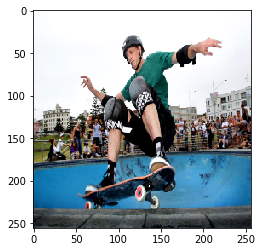

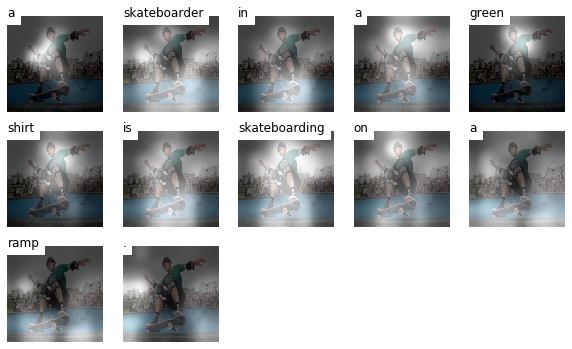

In [67]:
!wget -nv https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

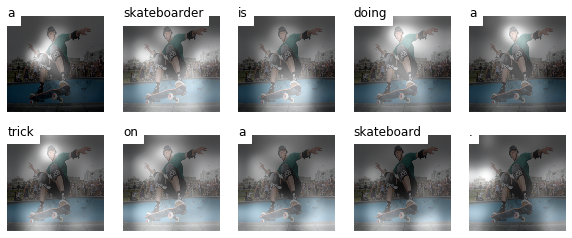

In [69]:
seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-23 05:05:19 URL:https://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg [106870/106870] -> "img.jpg" [1]


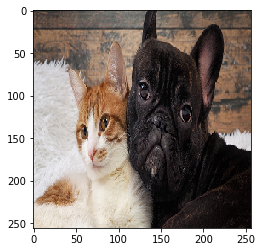

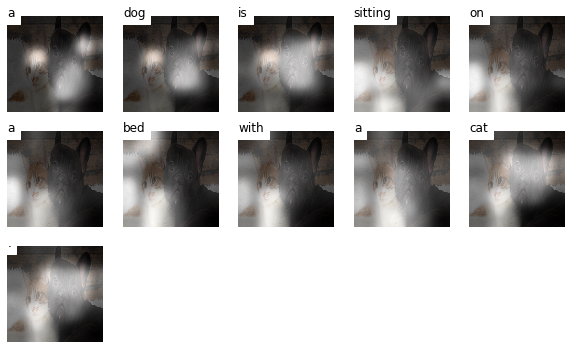

In [74]:
!wget -nv http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

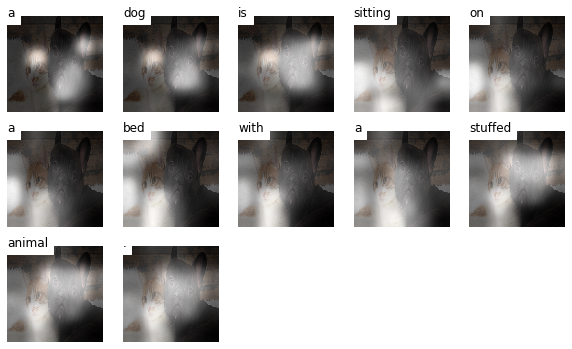

In [72]:
seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-23 05:18:40 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcReseHyoffy4WlXRV7odBq0ZLxmNdgvxlvs4f1mv1ZV5jm7JRC6 [8560/8560] -> "img.jpg" [1]


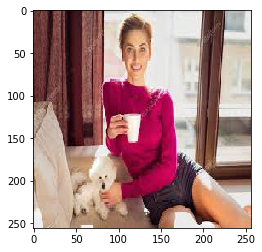

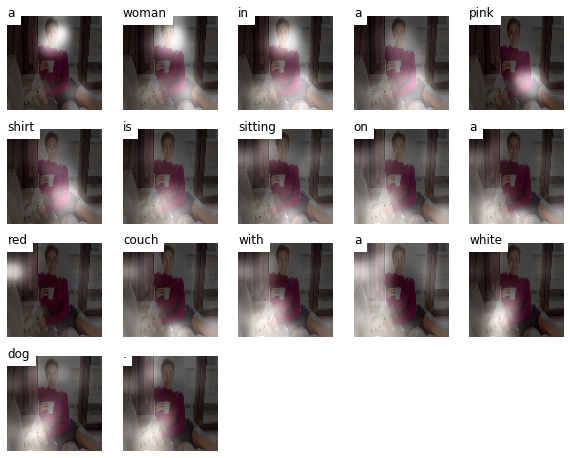

In [106]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcReseHyoffy4WlXRV7odBq0ZLxmNdgvxlvs4f1mv1ZV5jm7JRC6 -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=2)
visualize_att('img.jpg', seq, att, smooth=True)

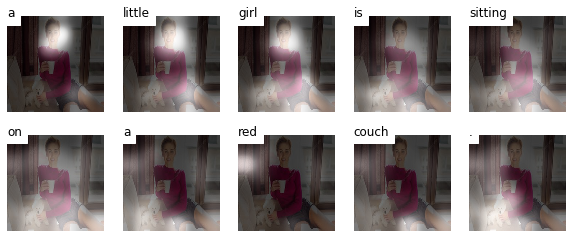

In [0]:
seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-23 05:26:13 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcTsDlSPHluolntOWcD-Fjlvjk4pv-_54p4hajvCg29rnNyY5LFX [8192/8192] -> "img.jpg" [1]


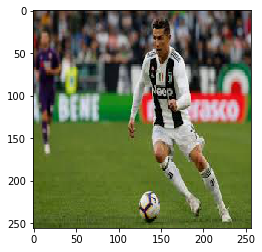

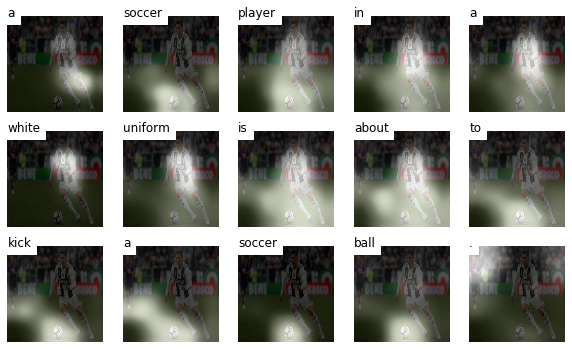

In [132]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcTsDlSPHluolntOWcD-Fjlvjk4pv-_54p4hajvCg29rnNyY5LFX -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

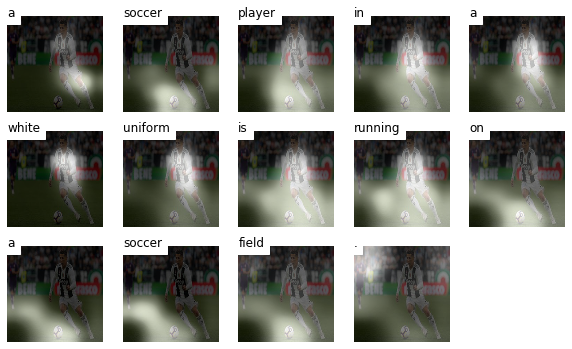

In [136]:
seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-23 05:28:04 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcRLy3gwG_Oz7rVPRnTaWsmCNoI-Lpj86KEQCW1ag02fRwrBMA0Z [5331/5331] -> "img.jpg" [1]


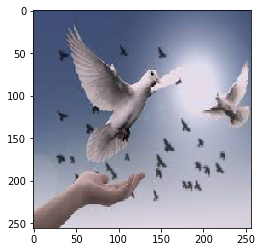

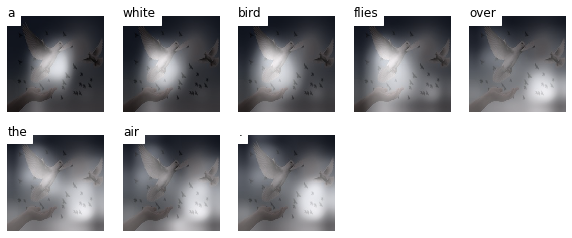

In [137]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcRLy3gwG_Oz7rVPRnTaWsmCNoI-Lpj86KEQCW1ag02fRwrBMA0Z -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img,st=5)
visualize_att('img.jpg', seq, att, smooth=True)

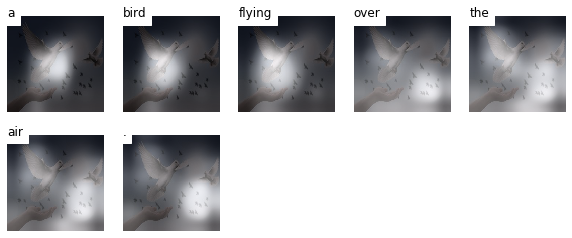

In [138]:
seq, att = network.sample(img,sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-23 05:31:16 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT50JLrar0jIMcl1A3MeTJiMRj0SBJAflY4l2Qx9hZR1U_tw8jK [9963/9963] -> "img.jpg" [1]


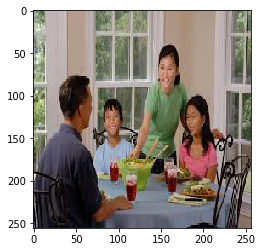

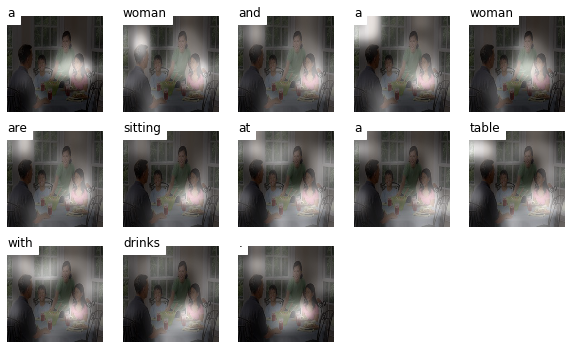

In [147]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT50JLrar0jIMcl1A3MeTJiMRj0SBJAflY4l2Qx9hZR1U_tw8jK -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

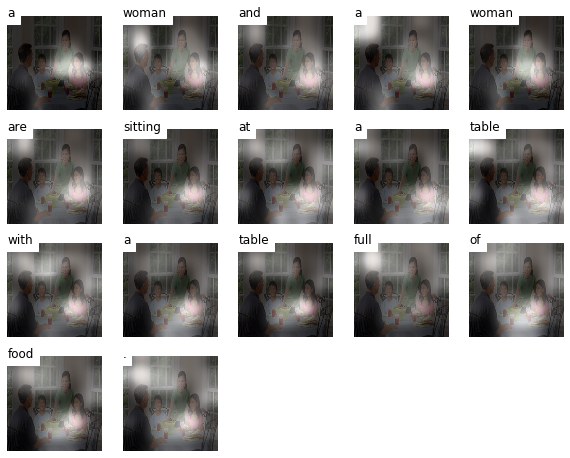

In [167]:
seq, att = network.sample(img, st=3)
visualize_att('img.jpg', seq, att, smooth=True)

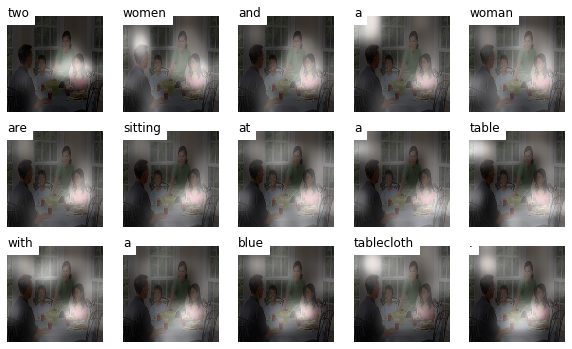

In [153]:
seq, att = network.sample(img, st=2)
visualize_att('img.jpg', seq, att, smooth=True)

## Модель с лучшим BLEU

In [168]:
network.load_state_dict(torch.load('/content/drive/My Drive/Image Captioning/Flickr30/2/v7_model_best_bleu.pt')) 

<All keys matched successfully>

In [0]:
network.eval()
network = network.to(device)

Сначала посмотрим на примеры из валидационного датасета:

In [0]:
num_img = 992

[' swimming instructors teaching young girls how to float in a pool .'
 ' man in black swimsuit plays in pool with three young children .'
 ' two men in wetsuits supervise children as they learn to swim .'
 ' swimming instructors show young girls how to float .'
 ' a group of children learning to swim .']


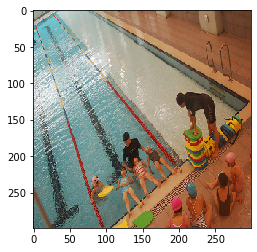

In [172]:
val_dataset.show_sample(num_img)

In [0]:
img, cap = val_dataset[num_img]

In [0]:
image_path = os.path.join(val_dataset.root_dir,
                                val_dataset.data_frame.image_name[num_img])

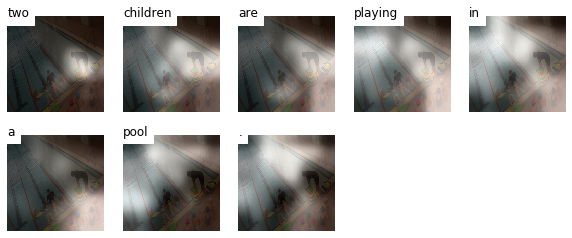

In [175]:
seq, att = network.sample(img.unsqueeze(0).to(device), sample=False)
visualize_att(image_path, seq, att, smooth=True)

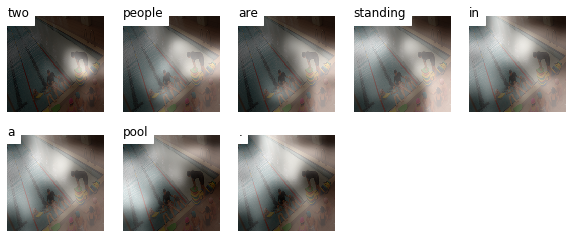

In [186]:
seq, att = network.sample(img.unsqueeze(0).to(device), st=3)
visualize_att(image_path, seq, att, smooth=True)

In [0]:
num_img = random.randint(0, len(val_dataset))

In [188]:
num_img

610

[" two women are standing outside looking at something with funny expressions on their faces while the other people around them do n't seem to notice ."
 ' a mother and her daughter are both wearing heels standing outside in a crowd on a brick pavement looking out at the street in amazement .'
 ' two women , one older and one younger , are stopped on a sidewalk looking at the same thing .'
 ' two confused ladies standing around after an event .'
 ' two women staring off into the distance .']


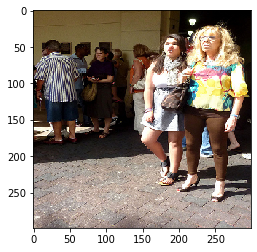

In [189]:
val_dataset.show_sample(num_img)

In [0]:
img, cap = val_dataset[num_img]

In [0]:
image_path = os.path.join(val_dataset.root_dir,
                                val_dataset.data_frame.image_name[num_img])

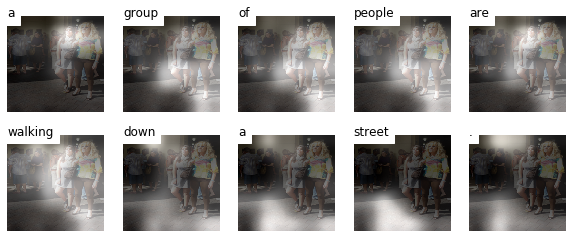

In [192]:
seq, att = network.sample(img.unsqueeze(0).to(device), sample=False)
visualize_att(image_path, seq, att, smooth=True)

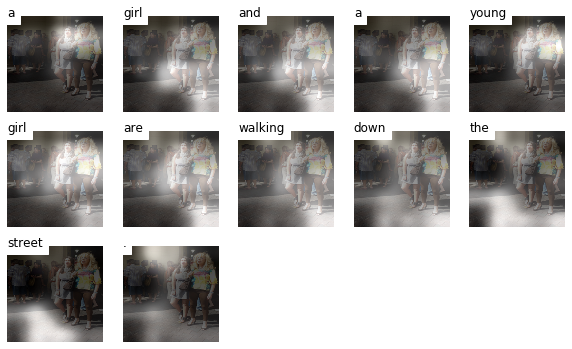

In [216]:
seq, att = network.sample(img.unsqueeze(0).to(device), st=2)
visualize_att(image_path, seq, att, smooth=True)

In [0]:
num_img = random.randint(0, len(val_dataset))

In [218]:
num_img

338

[' a family of two woman and a young child sits on the grass in a park in front of three young girls .'
 ' a group of adults and children relax on the grass in a park .'
 ' a family sits in the grass in a park in india .'
 ' a family is sitting in a park on the grass .'
 ' families are gathered in a park .']


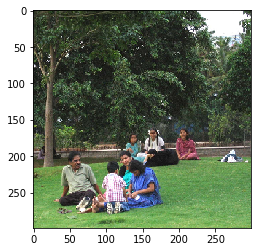

In [219]:
val_dataset.show_sample(num_img)

In [0]:
img, cap = val_dataset[num_img]

In [0]:
image_path = os.path.join(val_dataset.root_dir,
                                val_dataset.data_frame.image_name[num_img])

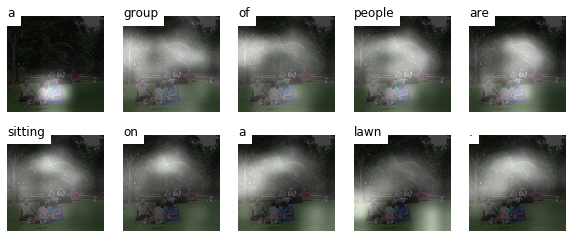

In [222]:
seq, att = network.sample(img.unsqueeze(0).to(device), sample=False)
visualize_att(image_path, seq, att, smooth=True)

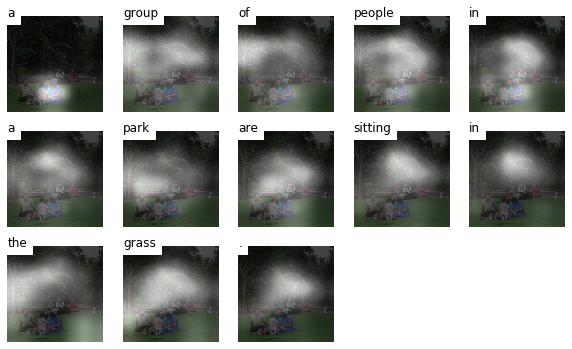

In [230]:
seq, att = network.sample(img.unsqueeze(0).to(device), st=2)
visualize_att(image_path, seq, att, smooth=True)

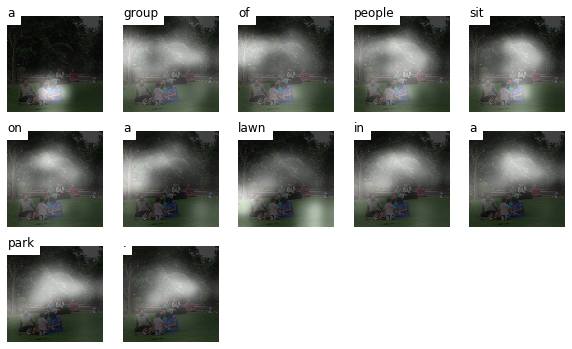

In [233]:
seq, att = network.sample(img.unsqueeze(0).to(device), st=3)
visualize_att(image_path, seq, att, smooth=True)

In [0]:
num_img = random.randint(0, len(val_dataset))

In [235]:
num_img

496

[' a old man wearing red , white and bluish gray playing music on a stage using a cross-cut saw .'
 ' a gentleman is playing the saw while surrounded by microphones .'
 ' an older gent shows his expertise in concert on the saw .'
 ' a man on stage with american flags behind him .'
 ' an elderly man speaks to a crowd .']


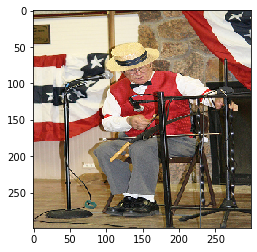

In [236]:
val_dataset.show_sample(num_img)

In [0]:
img, cap = val_dataset[num_img]

In [0]:
image_path = os.path.join(val_dataset.root_dir,
                                val_dataset.data_frame.image_name[num_img])

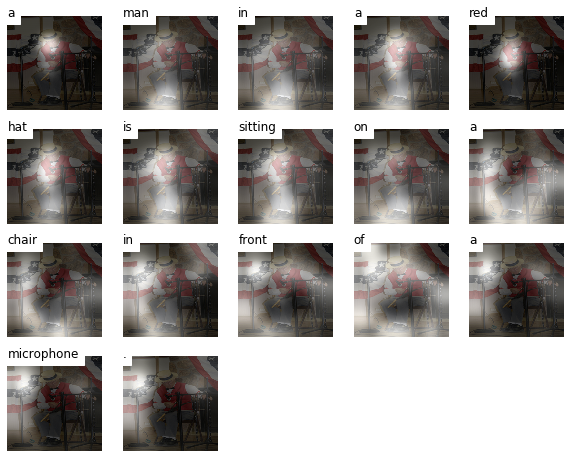

In [239]:
seq, att = network.sample(img.unsqueeze(0).to(device), sample=False)
visualize_att(image_path, seq, att, smooth=True)

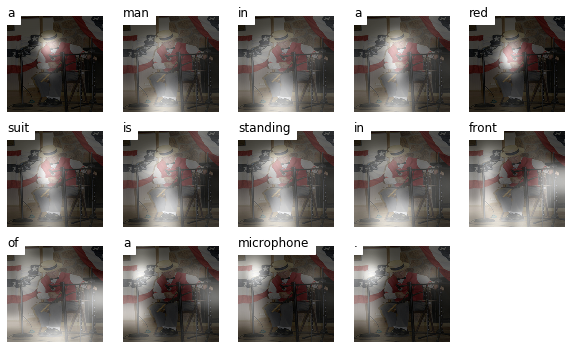

In [250]:
seq, att = network.sample(img.unsqueeze(0).to(device), st=3)
visualize_att(image_path, seq, att, smooth=True)

2020-02-23 05:51:20 URL:https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg [107928/107928] -> "img.jpg" [1]


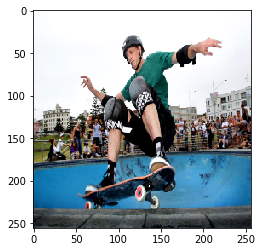

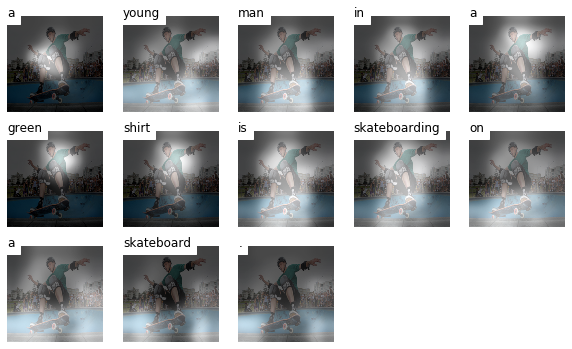

In [253]:
!wget -nv https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

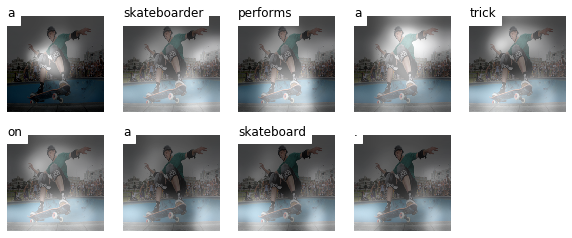

In [254]:
seq, att = network.sample(img, st=3)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-23 05:56:44 URL:https://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg [106870/106870] -> "img.jpg" [1]


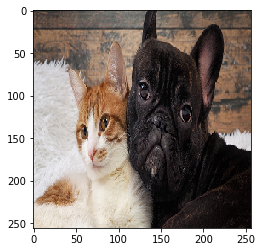

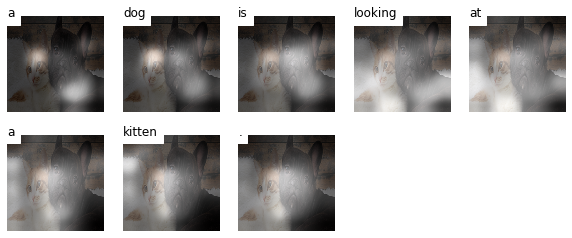

In [276]:
!wget -nv http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

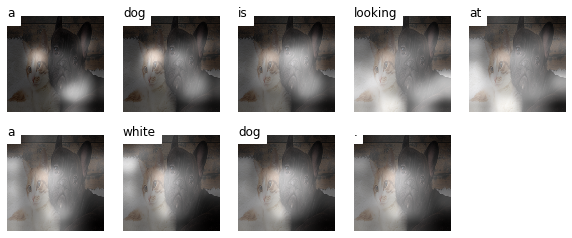

In [275]:
seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

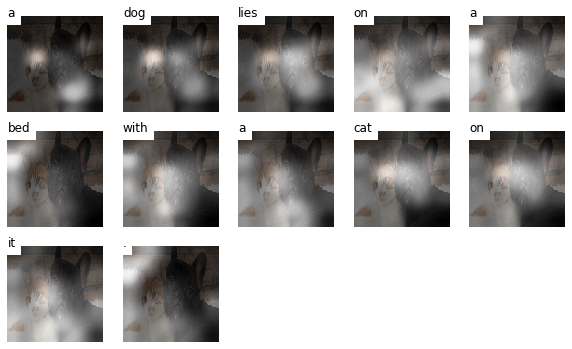

In [287]:
seq, att = network.sample(img, st=4)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-23 05:59:29 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcReseHyoffy4WlXRV7odBq0ZLxmNdgvxlvs4f1mv1ZV5jm7JRC6 [8560/8560] -> "img.jpg" [1]


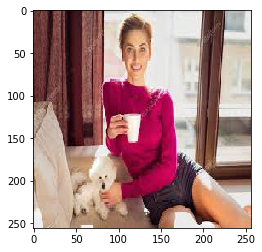

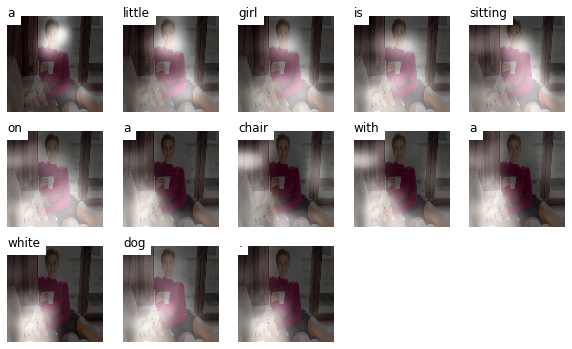

In [289]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcReseHyoffy4WlXRV7odBq0ZLxmNdgvxlvs4f1mv1ZV5jm7JRC6 -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

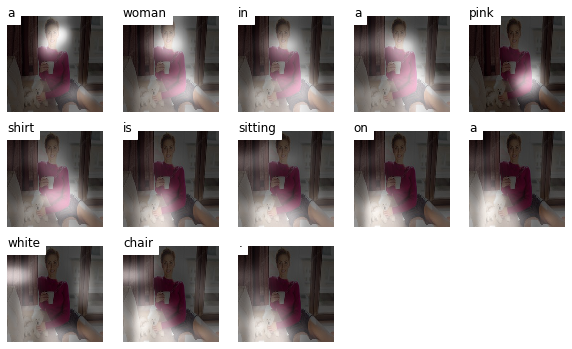

In [302]:
seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

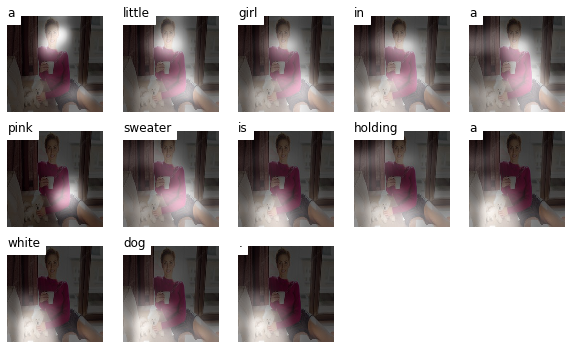

In [309]:
seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-23 06:03:09 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcTsDlSPHluolntOWcD-Fjlvjk4pv-_54p4hajvCg29rnNyY5LFX [8192/8192] -> "img.jpg" [1]


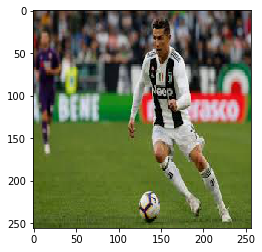

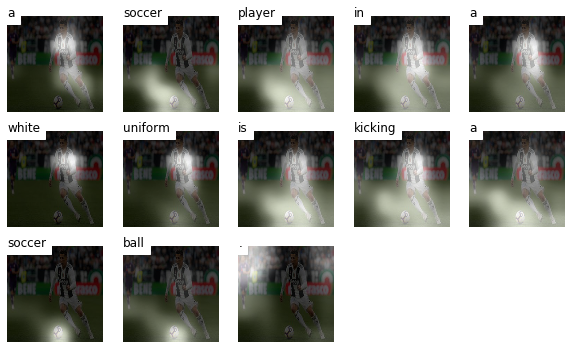

In [310]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcTsDlSPHluolntOWcD-Fjlvjk4pv-_54p4hajvCg29rnNyY5LFX -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

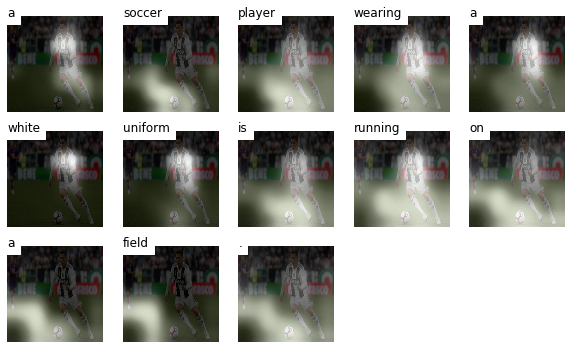

In [312]:
seq, att = network.sample(img, st=4)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-23 06:03:43 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcRLy3gwG_Oz7rVPRnTaWsmCNoI-Lpj86KEQCW1ag02fRwrBMA0Z [5331/5331] -> "img.jpg" [1]


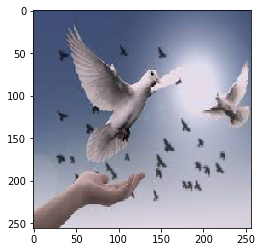

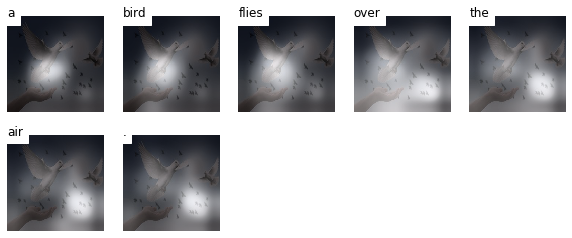

In [313]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcRLy3gwG_Oz7rVPRnTaWsmCNoI-Lpj86KEQCW1ag02fRwrBMA0Z -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

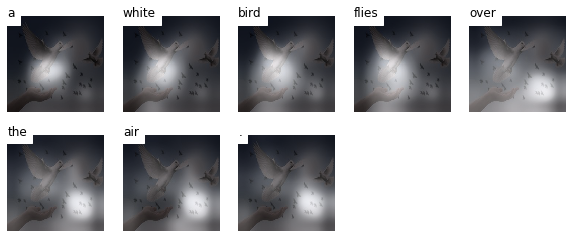

In [328]:
seq, att = network.sample(img, st=3)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-23 06:05:23 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT50JLrar0jIMcl1A3MeTJiMRj0SBJAflY4l2Qx9hZR1U_tw8jK [9963/9963] -> "img.jpg" [1]


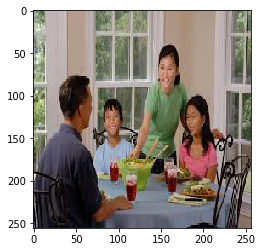

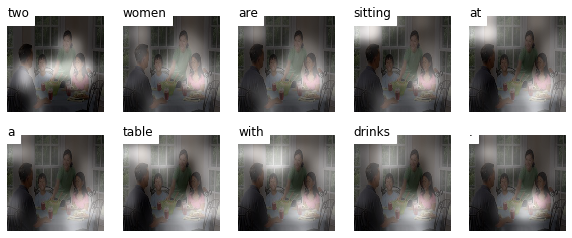

In [330]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT50JLrar0jIMcl1A3MeTJiMRj0SBJAflY4l2Qx9hZR1U_tw8jK -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

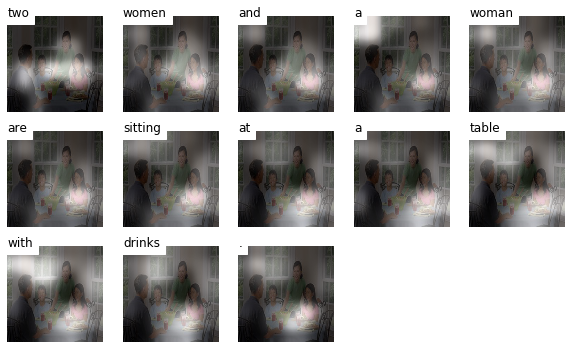

In [332]:
seq, att = network.sample(img, st=3)
visualize_att('img.jpg', seq, att, smooth=True)